## Preambule

In [120]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as pth
import xarray as xr
from plotly.subplots import make_subplots
from tqdm import tqdm
import plotly.graph_objects as go
from pathlib import Path

## Read in file

In [121]:
# XRe = xr.open_dataset("X:/user/dekkerm/Projects/ECEMF/WP1/Data/XRe.nc")
# XRw = xr.open_dataset("X:/user/dekkerm/Projects/ECEMF/WP1/Data/XRw.nc")

In [122]:
c400lins = ['DIAG-C400-lin-LimBio',
                        'DIAG-C400-lin-LimCCS',
                        'DIAG-C400-lin-LimNuclear',
                        'DIAG-C400-lin-HighVRE',
                        'DIAG-C400-lin-HighElectrification',
                        'DIAG-C400-lin-HighH2',
                        'DIAG-C400-lin-ResidualFossil',
                        'DIAG-C400-lin-HighEff',
                        "DIAG-C400-lin"]

scen_noc400 = ['DIAG-C400-lin-LimBio',
                        'DIAG-C400-lin-LimCCS',
                        'DIAG-C400-lin-LimNuclear',
                        'DIAG-C400-lin-HighVRE',
                        'DIAG-C400-lin-HighElectrification',
                        'DIAG-C400-lin-HighH2',
                        'DIAG-C400-lin-ResidualFossil',
                        'DIAG-C400-lin-HighEff']

scenarios = ['DIAG-Base',
             'DIAG-NPI',
             'DIAG-C400-lin',
             'DIAG-C80-gr5',
             'DIAG-C0to80-gr5',
             'DIAG-NZero',
             'DIAG-C400-lin-LimBio',
             'DIAG-C400-lin-LimCCS',
             'DIAG-C400-lin-LimNuclear',
             'DIAG-C400-lin-HighVRE',
             'DIAG-C400-lin-HighElectrification',
             'DIAG-C400-lin-HighH2',
             'DIAG-C400-lin-ResidualFossil',
             'DIAG-C400-lin-HighEff']

Models_noec = ['IMAGE 3.2',              # 
                'PROMETHEUS 1.2',         # 
                'OSeMBE v1.0.0',          # country-level (sum?)
                'REMIND 2.1',             # 
                'WITCH 5.1',              # 
                #'Euro-Calliope 2.0',      # Country-level (sum?)
                'MEESA v1.1',             # 
                'TIAM-ECN 1.2',           # 
                'MESSAGEix-GLOBIOM 1.2',  # 
                'PRIMES 2022'
                ]

ModelCols_noec = ["lightskyblue", #"turquoise", #"#c0c0c0",
             "goldenrod", #"turquoise"
             "firebrick", #"#ff00ff",
             "tomato", #"#800080",
             "forestgreen", #"#a52a2a",
             #"darkgrey", #"goldenrod",
             "magenta", #"tomato",
             "royalblue", # steelblue #"#4682b4",
             "purple",
             "palegreen"]#"#228b22"]

ModelCols = ["lightskyblue", #"turquoise", #"#c0c0c0",
             "goldenrod", #"turquoise"
             "firebrick", #"#ff00ff",
             "tomato", #"#800080",
             "forestgreen", #"#a52a2a",
             "darkgrey", #"goldenrod",
             "magenta", #"tomato",
             "royalblue", # steelblue #"#4682b4",
             "purple",
             "palegreen"]#"#228b22"]

all_models = ['IMAGE 3.2',              # 
                'PROMETHEUS 1.2',         # 
            'OSeMBE v1.0.0',          # country-level (sum?)
                'REMIND 2.1',             # 
                'WITCH 5.1',              # 
                'Euro-Calliope 2.0',      # Country-level (sum?)
                'MEESA v1.1',             # 
                'TIAM-ECN 1.2',           # 
                'MESSAGEix-GLOBIOM 1.2',  # 
                'PRIMES 2022'
                ]
Models_raw_noec = ["IMAGE", "PROMETHEUS", "OSeMBE", "REMIND-MAgPIE", "WITCH", "MEESA", "TIAM-ECN", "MESSAGE", "PRIMES"] 
Models_raw = ["IMAGE", "PROMETHEUS", "OSeMBE", "REMIND-MAgPIE", "WITCH", "Euro-Calliope", "MEESA", "TIAM-ECN", "MESSAGE", "PRIMES"] 

In [123]:
path_data = Path("X:/user/dekkerm/Projects/ECEMF/WP1/Data")

In [124]:
Models_touse = all_models
ModelCols_touse = ModelCols
Modelsraw_touse = Models_raw

## Some general stuff

In [125]:
df_total = pd.read_csv(path_data / "EuropeanData" / (all_models[0] + ".csv"))
for m_i in range(1, len(all_models)):
    df = pd.read_csv(path_data / "EuropeanData" / (all_models[m_i] + ".csv"))
    df_total = pd.concat([df_total, df])
df_total = df_total.reset_index(drop=True)
df_total = df_total[['Model', 'Scenario', 'Variable', '2005', '2010', '2015', '2020', '2025', '2030', '2035', '2040', '2045', '2050', '2060', '2070', '2080', '2090', '2100']]
df = df_total.melt(id_vars=["Variable", "Scenario", "Model"], var_name="Time", value_name="Value")

val = np.copy(df.Value)
val[(df.Scenario == "DIAG-C400-lin-ResidualFossil") & (df.Model == "IMAGE 3.2")] = np.nan
val[(df.Scenario == "DIAG-C400-lin-HighH2") & (df.Model == "IMAGE 3.2")] = np.nan
df.Value = val

df['Time'] = np.array(df['Time']).astype(int)
dfdummy = df.set_index(['Variable', "Scenario", "Model", 'Time'])
XRe = xr.Dataset.from_dataframe(dfdummy)
XRe = XRe.reindex(Time=np.arange(2005, 2101))
XRe = XRe.interpolate_na(dim="Time", method="linear")

## Conceptual figure

In [126]:
def point(angle, value):
    unit_x = 0.5*np.cos((90-angle)/360*np.pi*2)
    unit_y = 0.5*np.sin((90-angle)/360*np.pi*2)
    return (unit_x*value+0.5, unit_y*value+0.5)

def point_ex(angle, value, dx):
    unit_x = 0.5*np.cos((90-angle)/360*np.pi*2)
    unit_y = 0.5*np.sin((90-angle)/360*np.pi*2)
    p = (unit_x*value+0.5, unit_y*value+0.5)
    pa = (p[0]+dx*(-unit_y), p[1]+dx*(unit_x))
    pb = (p[0]+dx*(unit_y), p[1]+dx*(-unit_x))
    return p, pa, pb

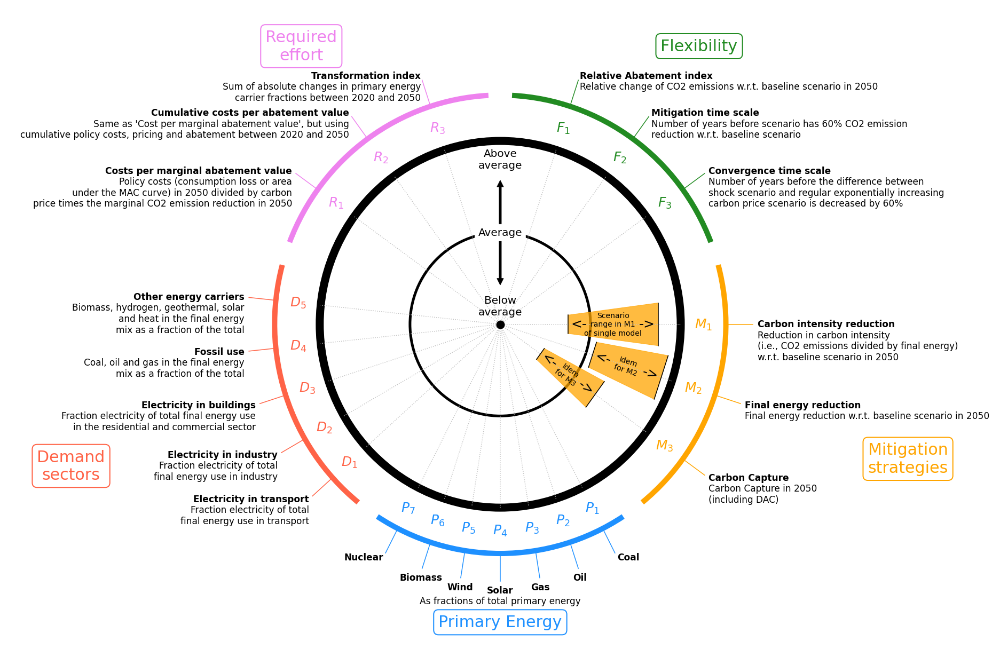

In [127]:
circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
dr = 3
vars = [["RAI", "ReactionTime", "Convergence"],
        ["CIred", "FEred", "CC"], # neg emis
        ["E_coal", "E_oil", "E_gas", "E_solar", "E_wind", "E_biomass2", "E_nuclear"],
        ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
        ["CAV", "CAVcum", "TI"]
        ]
names = [["Relative Abatement index", "Mitigation time scale", "Convergence time scale"],
        ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon Capture"],
        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
        ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Fossil use", "Other energy carriers"],
        ["Costs per\nmarginal abatement value", "Cumulative costs\nper abatement value", "Transformation index"]]
expl = [["Relative change of CO2 emissions w.r.t. baseline scenario in 2050",
         "Number of years before scenario has 60% CO2 emission\nreduction w.r.t. baseline scenario",
         "Number of years before the difference between\nshock scenario and regular exponentially increasing\ncarbon price scenario is decreased by 60%"],
        ["Reduction in carbon intensity\n(i.e., CO2 emissions divided by final energy)\nw.r.t. baseline scenario in 2050",
         "Final energy reduction w.r.t. baseline scenario in 2050",
         "Carbon Capture in 2050\n(including DAC)"],
        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
        ["Fraction electricity of total\nfinal energy use in transport",
         "Fraction electricity of total\nfinal energy use in industry",
         "Fraction electricity of total final energy use\nin the residential and commercial sector",
         "Coal, oil and gas in the final energy\nmix as a fraction of the total",
         "Biomass, hydrogen, geothermal, solar\nand heat in the final energy\nmix as a fraction of the total"],
        ["Policy costs (consumption loss or area\nunder the MAC curve) in 2050 divided by carbon\nprice times the marginal CO2 emission reduction in 2050",
         "Same as 'Cost per marginal abatement value', but using\ncumulative policy costs, pricing and abatement between 2020 and 2050",
         "Sum of absolute changes in primary energy\ncarrier fractions between 2020 and 2050"]]
names2 = [[r"$F_1$", r"$F_2$", r"$F_3$"],
        [r"$M_1$", r"$M_2$", r"$M_3$"],
        [r"$P_1$", r"$P_2$", r"$P_3$", r"$P_4$", r"$P_5$", r"$P_6$", r"$P_7$"],
        [r"$D_1$", r"$D_2$", r"$D_3$",r"$D_4$", r"$D_5$"],
        [r"$R_1$", r"$R_2$", r"$R_3$"]]
cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
incr = 360/len(vars)
da = (90 - 360/len(vars))
arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)

fig, ax = plt.subplots(1, 1, figsize=(28, 17))
ax.add_patch(circle_border)
ax.add_patch(circle_average)
ax.add_patch(arc_outer_1)
ax.add_patch(arc_outer_2)
ax.add_patch(arc_outer_3)
ax.add_patch(arc_outer_4)
ax.add_patch(arc_outer_5)
ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)

# Actual data
time = 2050
for vl_i, vl in enumerate(vars):
        for var_i, var in enumerate(vl):
                pas = []
                pbs = []
                vals = []
                angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                p0 = point(angle, 0.4*2)
                ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver')
                p0 = point(angle, 0.4*2+0.1)
                ax.text(p0[0], p0[1], names2[vl_i][var_i], fontsize=25, c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ha='center', va='center')
                if var_i == 0 and vl_i == 1:
                        val = 0.3
                        _, pa1, pb1 = point_ex(angle, val, 0.4*val/len(vl))
                        val = 0.7
                        _, pa2, pb2 = point_ex(angle, val, 0.4*val/len(vl))
                        t1 = plt.Polygon([pa1, pb1, pb2, pa2], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.75)
                        ax.add_patch(t1)
                        p, pa, pb = point_ex(angle, 0.5, 0.4*0.5/len(vl))
                        ax.text(p[0], p[1], 'Scenario\nrange in M1\nof single model', fontsize=14, ha='center', va='center', rotation = 90-angle)
                        p, pa, pb = point_ex(angle, 0.35, 0.4*0.35/len(vl))
                        ax.text(p[0], p[1], '<-', fontsize=25, ha='center', va='center', rotation = 90-angle)
                        p, pa, pb = point_ex(angle, 0.65, 0.4*0.65/len(vl))
                        ax.text(p[0], p[1], '->', fontsize=25, ha='center', va='center', rotation = 90-angle)
                        ax.plot([pa1[0], pb1[0]], [pa1[1], pb1[1]], c='black', zorder=1e9)
                        ax.plot([pa2[0], pb2[0]], [pa2[1], pb2[1]], c='black', zorder=1e9)
                if var_i in [1, 2] and vl_i == 1:
                        v1 = [0.43, 0.22][var_i-1]
                        _, pa1, pb1 = point_ex(angle, v1, 0.4*v1/len(vl))
                        v2 = [0.75, 0.52][var_i-1]
                        _, pa2, pb2 = point_ex(angle, v2, 0.4*v2/len(vl))
                        t1 = plt.Polygon([pa1, pb1, pb2, pa2], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.75)
                        ax.add_patch(t1)
                        p, pa, pb = point_ex(angle, (v1+v2)/2, 0.4*(v1+v2)/2/len(vl))
                        ax.text(p[0], p[1], 'Idem\nfor M'+str(var_i+1), fontsize=14, ha='center', va='center', rotation = 90-angle)
                        p, pa, pb = point_ex(angle, (v1+0.05), 0.4*(v1+0.05)/len(vl))
                        ax.text(p[0], p[1], '<-', fontsize=25, ha='center', va='center', rotation = 90-angle)
                        p, pa, pb = point_ex(angle, (v2-0.05), 0.4*(v2-0.05)/len(vl))
                        ax.text(p[0], p[1], '->', fontsize=25, ha='center', va='center', rotation = 90-angle)
                        ax.plot([pa1[0], pb1[0]], [pa1[1], pb1[1]], c='black', zorder=1e9)
                        ax.plot([pa2[0], pb2[0]], [pa2[1], pb2[1]], c='black', zorder=1e9)
                
                # Further explanations
                p0 = point(angle, 0.4*2+0.2)
                p1 = point(angle, 0.4*2+0.32)
                p2 = point(angle, 0.4*2+0.34)
                if angle <= 160:
                        a = 'left'
                        dy = 0
                elif angle <= 200:
                        a = 'center'
                        dy = -0.01
                else:
                        a = 'right'
                        dy = 0
                ax.plot([p0[0], p1[0]], [p0[1], p1[1]], c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i])
                ax.text(p2[0], p2[1]+dy, names[vl_i][var_i].replace('\n', ' '), fontsize=17, ha=a, va='center', weight='bold')
                if vl_i != 2:
                        ax.text(p2[0], p2[1]-0.013, expl[vl_i][var_i], fontsize=17, ha=a, va='top')
                elif var_i == 3:
                        ax.text(p2[0], p2[1]-0.023, "As fractions of total primary energy", fontsize=17, ha=a, va='top')

ax.text(0.5, 0.54, 'Below\naverage', fontsize=20, ha='center', va='center', zorder=1e999)
ax.text(0.5, 0.7, 'Average', fontsize=20, ha='center', va='center', zorder=1e999, bbox=dict(boxstyle="round",
                   ec='white',
                   fc='white',
                   ))
ax.text(0.5, 0.86, 'Above\naverage', fontsize=20, ha='center', va='center', zorder=1e999)

Cats = ["Flexibility", "Mitigation strategies", "Primary Energy", "Demand sectors", "Required effort"]
for c_i, c in enumerate(Cats):
        p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), [1.5, 1.9, 1.3, 2., 1.5][c_i])
        cl = c.split(' ')
        bb = bbox=dict(boxstyle="round", ec=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fc='white', lw=2)
        if len(cl)>1 and c_i != 2:
                c = cl[0]+'\n'+cl[1]
                ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=30, va='center', ha='center', bbox=bb)
        else:
                ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=30, va='center', ha='center', bbox=bb)

ax.annotate("", xy=(0.5, 0.82), xytext=(0.5, 0.7),
            arrowprops=dict(shrink=0.05, facecolor='k'))
ax.annotate("", xy=(0.5, 0.58), xytext=(0.5, 0.7),
            arrowprops=dict(shrink=0.05, facecolor='k'))

# Other
ax.set_xlim([-0.6, 1.6])
ax.set_ylim([-0.2, 1.2])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])

plt.tight_layout()
plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/Figure_1.png", dpi = 200, bbox_inches = "tight")

## Read and process

In [128]:
df_total = pd.read_csv(path_data / "EuropeanData" / (Models_touse[0] + ".csv"))
for m_i in range(1, len(Models_touse)):
    df = pd.read_csv(path_data / "EuropeanData" / (Models_touse[m_i] + ".csv"))
    df_total = pd.concat([df_total, df])
df_total = df_total.reset_index(drop=True)
df_total = df_total[['Model', 'Scenario', 'Variable', '2005', '2010', '2015', '2020', '2025', '2030', '2035', '2040', '2045', '2050', '2060', '2070', '2080', '2090', '2100']]
df = df_total.melt(id_vars=["Variable", "Scenario", "Model"], var_name="Time", value_name="Value")

val = np.copy(df.Value)
val[(df.Scenario == "DIAG-C400-lin-ResidualFossil") & (df.Model == "IMAGE 3.2")] = np.nan
val[(df.Scenario == "DIAG-C400-lin-HighH2") & (df.Model == "IMAGE 3.2")] = np.nan
df.Value = val

df['Time'] = np.array(df['Time']).astype(int)
dfdummy = df.set_index(['Variable', "Scenario", "Model", 'Time'])
XRe = xr.Dataset.from_dataframe(dfdummy)
XRe = XRe.reindex(Time=np.arange(2005, 2101))
XRe = XRe.interpolate_na(dim="Time", method="linear")

In [129]:
emisvar = "Emissions|CO2|Energy and Industrial Processes" #Emissions|CO2|Energy and Industrial Processes

#### (1) Flexibility

In [130]:
XRe = XRe.assign(RAI = (XRe.sel(Variable = emisvar, Scenario="DIAG-Base").Value - XRe.sel(Variable = emisvar).Value) / XRe.sel(Variable = emisvar, Scenario="DIAG-Base").Value)
percred = 0.6
initial = np.array(XRe.sel(Variable = emisvar, Time=np.arange(2020, 2101), Scenario="DIAG-Base").Value)
series = np.array(XRe.sel(Variable = emisvar, Scenario=scenarios, Time=np.arange(2020, 2101)).Value)
years = np.zeros(shape=(len(scenarios), len(Models_touse)))
for m_i, m in enumerate(XRe.Model):
    for s_i, s in enumerate(scenarios):
        wh = np.where(series[s_i, m_i] < initial[m_i]*(1-percred))[0]
        if len(wh)>0:
            years[s_i, m_i] = np.arange(2020, 2101)[wh[0]]-2020
        else:
            years[s_i, m_i] = np.nan
XRe = XRe.assign(ReactionTime = xr.DataArray(data=years, coords=dict(Scenario=scenarios, Model=XRe.Model)))
initial = np.array(XRe.sel(Variable = emisvar, Scenario="DIAG-C0to80-gr5", Time=2040).Value-XRe.sel(Variable = emisvar, Scenario="DIAG-C80-gr5", Time=2040).Value)
series = np.array(XRe.sel(Variable = emisvar, Scenario="DIAG-C0to80-gr5", Time=np.arange(2040, 2101)).Value)
years = []
for m_i, m in enumerate(XRe.Model):
    wh = np.where(series[m_i] < initial[m_i]*(1-percred))[0]
    if len(wh)>0:
        years.append(np.arange(2040, 2101)[wh[0]]-2040)
    else:
        years.append(np.nan)
XRe = XRe.assign(Convergence = xr.DataArray(data=[years]*len(scenarios), coords=dict(Scenario=scenarios, Model=XRe.Model)))

(2) Mitigation strategies

In [131]:
XRe = XRe.assign(CI = XRe.sel(Variable = emisvar).Value / XRe.sel(Variable = "Final Energy").Value)
XRe = XRe.assign(CIred = (XRe.CI.sel(Scenario="DIAG-Base") - XRe.CI)/XRe.CI.sel(Scenario="DIAG-Base"))
XRe = XRe.assign(FEred = (XRe.sel(Variable = "Final Energy", Scenario = "DIAG-Base").Value - XRe.sel(Variable = "Final Energy").Value) / XRe.sel(Variable = "Final Energy", Scenario = "DIAG-Base").Value)
XRe = XRe.assign(CC = XRe.sel(Variable = "Carbon Capture", Time=2050).Value)

(3) Electricity generation

In [132]:
XRe = XRe.assign(E_coal = XRe.sel(Variable = "Secondary Energy|Electricity|Coal").Value / XRe.sel(Variable = "Secondary Energy|Electricity").Value)
XRe = XRe.assign(E_oil = XRe.sel(Variable = "Secondary Energy|Electricity|Oil").Value / XRe.sel(Variable = "Secondary Energy|Electricity").Value)
XRe = XRe.assign(E_gas = XRe.sel(Variable = "Secondary Energy|Electricity|Gas").Value / XRe.sel(Variable = "Secondary Energy|Electricity").Value)
XRe = XRe.assign(E_solar = XRe.sel(Variable = "Secondary Energy|Electricity|Solar").Value / XRe.sel(Variable = "Secondary Energy|Electricity").Value)
XRe = XRe.assign(E_wind = XRe.sel(Variable = "Secondary Energy|Electricity|Wind").Value / XRe.sel(Variable = "Secondary Energy|Electricity").Value)
XRe = XRe.assign(E_nuclear = XRe.sel(Variable = "Secondary Energy|Electricity|Nuclear").Value / XRe.sel(Variable = "Secondary Energy|Electricity").Value)
XRe = XRe.assign(E_biomass1 = XRe.sel(Variable = "Secondary Energy|Electricity|Biomass").Value / XRe.sel(Variable = "Secondary Energy|Electricity").Value)

In [133]:
XRe = XRe.assign(E_biomass2 = XRe.sel(Variable = ["Secondary Energy|Electricity|Biomass|w/o CCS",
                                                    "Secondary Energy|Electricity|Biomass|w/ CCS"]).Value.sum(dim="Variable") / XRe.sel(Variable = "Secondary Energy|Electricity").Value)

In [134]:
XRe = XRe.assign(P_coal = XRe.sel(Variable = "Primary Energy|Coal").Value / XRe.sel(Variable = "Primary Energy").Value)
XRe = XRe.assign(P_oil = XRe.sel(Variable = "Primary Energy|Oil").Value / XRe.sel(Variable = "Primary Energy").Value)
XRe = XRe.assign(P_gas = XRe.sel(Variable = "Primary Energy|Gas").Value / XRe.sel(Variable = "Primary Energy").Value)
XRe = XRe.assign(P_solar = XRe.sel(Variable = "Primary Energy|Solar").Value / XRe.sel(Variable = "Primary Energy").Value)
XRe = XRe.assign(P_wind = XRe.sel(Variable = "Primary Energy|Wind").Value / XRe.sel(Variable = "Primary Energy").Value)
XRe = XRe.assign(P_nuclear = XRe.sel(Variable = "Primary Energy|Nuclear").Value / XRe.sel(Variable = "Primary Energy").Value)
XRe = XRe.assign(P_biomass = XRe.sel(Variable = "Primary Energy|Biomass").Value / XRe.sel(Variable = "Primary Energy").Value)

(4) Demand sectors

In [135]:
XRe = XRe.assign(Fossil_total = (XRe.sel(Variable = ["Final Energy|Gases",
                                                    "Final Energy|Solids",
                                                    "Final Energy|Liquids"]).Value.sum(dim="Variable") - 
                                 XRe.sel(Variable = ["Final Energy|Gases|Biomass",
                                                    "Final Energy|Solids|Biomass",
                                                    "Final Energy|Liquids|Biomass"]).Value.sum(dim="Variable")) / XRe.sel(Variable = "Final Energy").Value)


XRe = XRe.assign(D_Etrans = (XRe.sel(Variable = ["Final Energy|Transportation|Electricity"]).Value.sum(dim="Variable"))/XRe.sel(Variable="Final Energy|Transportation").Value)
XRe = XRe.assign(D_Eindus = (XRe.sel(Variable = ["Final Energy|Industry|Electricity"]).Value.sum(dim="Variable"))/XRe.sel(Variable="Final Energy|Industry").Value)
XRe = XRe.assign(D_Ebuild = (XRe.sel(Variable = ["Final Energy|Residential and Commercial|Electricity"]).Value.sum(dim="Variable"))/XRe.sel(Variable="Final Energy|Residential and Commercial").Value)
XRe = XRe.assign(Other_total = (XRe.sel(Variable = ["Final Energy|Hydrogen",
                                                    "Final Energy|Liquids|Biomass",
                                                    "Final Energy|Gases|Biomass",
                                                    "Final Energy|Solids|Biomass",
                                                    "Final Energy|Geothermal",
                                                    "Final Energy|Solar",
                                                    "Final Energy|Heat",]).Value.sum(dim="Variable"))/XRe.sel(Variable="Final Energy").Value)

(5) Costs

In [136]:
XRe = XRe.assign(CAVcum = XRe.sel(Variable=["Policy Cost|Consumption Loss", "Policy Cost|Area under MAC Curve"], Time=np.arange(2020, 2051)).Value.sum(dim=["Variable", "Time"]) / (XRe.sel(Variable="Price|Carbon", Time=np.arange(2020, 2051)).Value.mean(dim="Time") * (XRe.sel(Variable=emisvar, Time=2020).Value-XRe.sel(Variable=emisvar, Time=2050).Value)))
XRe = XRe.assign(CAV = XRe.sel(Variable=["Policy Cost|Consumption Loss", "Policy Cost|Area under MAC Curve"], Time=2050).Value.sum(dim="Variable") / (XRe.sel(Variable="Price|Carbon", Time=2050).Value * (XRe.sel(Variable=emisvar, Time=2050).Value-XRe.sel(Variable=emisvar, Time=2051).Value)))
XRe = XRe.assign(TI = np.abs(XRe.sel(Variable="Primary Energy|Coal", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Coal", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value)+
                      np.abs(XRe.sel(Variable="Primary Energy|Oil", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Oil", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value)+
                      np.abs(XRe.sel(Variable="Primary Energy|Gas", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Gas", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value)+
                      np.abs(XRe.sel(Variable="Primary Energy|Solar", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Solar", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value)+
                      np.abs(XRe.sel(Variable="Primary Energy|Wind", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Wind", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value)+
                      np.abs(XRe.sel(Variable="Primary Energy|Nuclear", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Nuclear", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value)+
                      np.abs(XRe.sel(Variable="Primary Energy|Hydro", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Hydro", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value)+
                      np.abs(XRe.sel(Variable="Primary Energy|Biomass", Time=2050).Value/XRe.sel(Variable="Primary Energy", Time=2050).Value - XRe.sel(Variable="Primary Energy|Biomass", Time=2020).Value/XRe.sel(Variable="Primary Energy", Time=2020).Value))

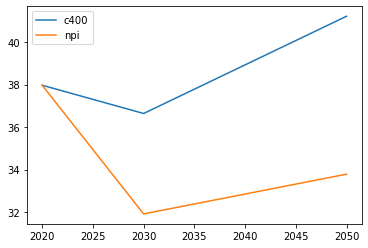

In [137]:
plt.plot(XRe.Time, XRe.sel(Model="Euro-Calliope 2.0", Scenario='DIAG-C400-lin', Variable="Final Energy").Value, label='c400')
plt.plot(XRe.Time, XRe.sel(Model="Euro-Calliope 2.0", Scenario='DIAG-NPI', Variable="Final Energy").Value, label='npi')
plt.legend()

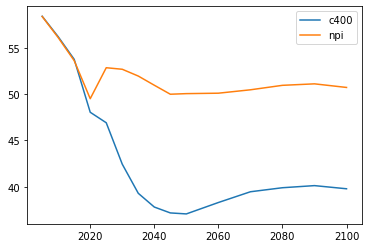

In [151]:
plt.plot(XRe.Time, XRe.sel(Model="IMAGE 3.2", Scenario='DIAG-C400-lin', Variable="Final Energy").Value, label='c400')
plt.plot(XRe.Time, XRe.sel(Model="IMAGE 3.2", Scenario='DIAG-Base', Variable="Final Energy").Value, label='npi')
plt.legend()

## Fig 2

In [138]:
fig = make_subplots(rows=1, cols=2,
                horizontal_spacing = 0.08, vertical_spacing=0.12)

for col_i, col in enumerate([1, 2]):
        var_x = [XRe.ReactionTime.sel(Model=Models_touse), XRe.CIred.sel(Time=2050, Model=Models_touse)][col_i]
        var_y = [XRe.RAI.sel(Time=2050, Model=Models_touse), XRe.FEred.sel(Time=2050, Model=Models_touse)][col_i]

        leg = [True, False][col_i]
        names = ['Bio', 'CCS', 'Nuc', 'VRE', 'Ele', 'H2', 'Fos', 'Eff']

        m_y = var_y.sel(Scenario=c400lins).mean()
        m_y1 = var_y.sel(Scenario=c400lins).mean()+var_y.sel(Scenario=c400lins).std()
        m_y0 = var_y.sel(Scenario=c400lins).mean()-var_y.sel(Scenario=c400lins).std()
        m_x = var_x.sel(Scenario=c400lins).mean()
        m_x1 = var_x.sel(Scenario=c400lins).mean()+var_x.sel(Scenario=c400lins).std()
        m_x0 = var_x.sel(Scenario=c400lins).mean()-var_x.sel(Scenario=c400lins).std()

        mn_x = [7.2, 0.611][col_i]
        mn_y = [0.736, -0.23][col_i]

        fig.add_trace(go.Scatter(x=[0, mn_x, 100], y=[m_y]*3, text='\u03BC', textfont={"size": 15}, mode='text+lines', showlegend=False, line={'dash':'dash'}, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[0, mn_x, 100], y=[m_y1]*3, text='+\u03C3', textfont={"size": 15}, mode='text', showlegend=False, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[0, mn_x, 100], y=[m_y0]*3, text='-\u03C3', textfont={"size": 15}, mode='text', showlegend=False, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[0, mn_x, 100], y=[m_y1+var_y.sel(Scenario=c400lins).std()]*3, text='+2\u03C3', textfont={"size": 15}, mode='text', showlegend=False, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[0, mn_x, 100], y=[m_y0-var_y.sel(Scenario=c400lins).std()]*3, text='-2\u03C3', textfont={"size": 15}, mode='text', showlegend=False, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[0, 100, 100, 0], y=[m_y0, m_y0, m_y1, m_y1], fillcolor='silver', line={'color':'silver'}, showlegend=False, fill='toself', opacity=0.2), 1, col)
        fig.add_trace(go.Scatter(x=[0, 100, 100, 0], y=[m_y0-var_y.sel(Scenario=c400lins).std(), m_y0-var_y.sel(Scenario=c400lins).std(), m_y1+var_y.sel(Scenario=c400lins).std(), m_y1+var_y.sel(Scenario=c400lins).std()], showlegend=False, fillcolor='silver', line={'color':'silver'}, fill='toself', opacity=0.05), 1, col)

        fig.add_trace(go.Scatter(x=[m_x]*3, y=[-10, mn_y, 10], text='\u03BC', textfont={"size": 15}, mode='text+lines', showlegend=False, line={'dash':'dash'}, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[m_x1]*3, y=[-10, mn_y, 10], text='+\u03C3', textfont={"size": 15}, mode='text', showlegend=False, line={'dash':'dash'}, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[m_x0]*3, y=[-10, mn_y, 10], text='-\u03C3', textfont={"size": 15}, mode='text', showlegend=False, line={'dash':'dash'}, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[m_x1+var_x.sel(Scenario=c400lins).std()]*3, y=[-10, mn_y, 10], text='+2\u03C3', textfont={"size": 15}, mode='text', showlegend=False, line={'dash':'dash'}, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[m_x0-var_x.sel(Scenario=c400lins).std()]*3, y=[-10, mn_y, 10], text='-2\u03C3', textfont={"size": 15}, mode='text', showlegend=False, line={'dash':'dash'}, marker = {"symbol": "square", "color": 'silver', "size": 35, "line": {"color": "black", "width": 0}}), 1, col)
        fig.add_trace(go.Scatter(x=[m_x0, m_x0, m_x1, m_x1], y=[-10, 10, 10, -10], fillcolor='silver', line={'color':'silver'}, showlegend=False, fill='toself', opacity=0.2), 1, col)
        fig.add_trace(go.Scatter(x=[m_x0-var_x.sel(Scenario=c400lins).std(), m_x0-var_x.sel(Scenario=c400lins).std(), m_x1+var_x.sel(Scenario=c400lins).std(), m_x1+var_x.sel(Scenario=c400lins).std()], y=[-10, 10, 10, -10], showlegend=False, fillcolor='silver', line={'color':'silver'}, fill='toself', opacity=0.05), 1, col)

        for m_i, m in enumerate(Models_touse):
                for s_i, s in enumerate(['DIAG-C400-lin-LimBio',
                        'DIAG-C400-lin-LimCCS',
                        'DIAG-C400-lin-LimNuclear',
                        'DIAG-C400-lin-HighVRE',
                        'DIAG-C400-lin-HighElectrification',
                        'DIAG-C400-lin-HighH2',
                        'DIAG-C400-lin-ResidualFossil',
                        'DIAG-C400-lin-HighEff']):
                        fig.add_trace(go.Scatter(x=[var_x.sel(Scenario="DIAG-C400-lin", Model=m), var_x.sel(Scenario=s, Model=m)],
                                                y=[var_y.sel(Scenario="DIAG-C400-lin", Model=m), var_y.sel(Scenario=s, Model=m)], name=m,
                                                mode='lines+markers',
                                                showlegend=False,
                                                line={'width': 3, 'dash': 'solid'},
                                                text=["", names[s_i]],
                                                textfont = dict(color='black',
                                                                size=15),
                                                marker={"color": ModelCols_touse[m_i],
                                                        "size": 30,
                                                        "line": {"color": "black", "width": 0.5}}
                                                ), 1, col)

        for m_i, m in enumerate(Models_touse):
                for s_i, s in enumerate(['DIAG-C400-lin-LimBio',
                        'DIAG-C400-lin-LimCCS',
                        'DIAG-C400-lin-LimNuclear',
                        'DIAG-C400-lin-HighVRE',
                        'DIAG-C400-lin-HighElectrification',
                        'DIAG-C400-lin-HighH2',
                        'DIAG-C400-lin-ResidualFossil',
                        'DIAG-C400-lin-HighEff']):
                        fig.add_trace(go.Scatter(x=[var_x.sel(Scenario="DIAG-C400-lin", Model=m), var_x.sel(Scenario=s, Model=m)],
                                                y=[var_y.sel(Scenario="DIAG-C400-lin", Model=m), var_y.sel(Scenario=s, Model=m)], name=m,
                                                mode='text+markers',
                                                showlegend=False,
                                                text=["", names[s_i]],
                                                textfont = dict(color='black',
                                                                size=15),
                                                marker={"color": ModelCols_touse[m_i],
                                                        "size": 30,
                                                        "line": {"color": "black", "width": 0.5}}
                                                ), 1, col)

        for m_i, m in enumerate(Models_touse):
                fig.add_trace(go.Scatter(x=[var_x.sel(Scenario="DIAG-C400-lin", Model=m)],
                                        y=[var_y.sel(Scenario="DIAG-C400-lin", Model=m)],
                                        mode='markers+text',
                                        showlegend=leg, line_width=4,
                                        name=Modelsraw_touse[m_i],
                                        text="<b>"+m[0]+"</b>",
                                        hovertemplate='<b>DIAG-C400-lin</b> <br>'+"ERT"+': %{y:.2f} <br>'+"Carbon capture"+': %{x:.2f}',
                                        marker={"color": ModelCols_touse[m_i],
                                                "size": 30,
                                                "symbol": "square",
                                                "line": {"color": "black", "width": 4}}
                                        ), 1, col)

        fig.update_xaxes(row=1, col=col, title=["Mitigation Time Scale (F<sub>2</sub>)", 'Carbon Intensity Reduction (M<sub>1</sub>)'][col_i], title_font_size=25, range=[[7, 21], [0.6, 1.2]][col_i])
        fig.update_yaxes(row=1, col=col, title=["Relative Abatement Index (F<sub>1</sub>)", 'Final Energy Reduction (M<sub>2</sub>)'][col_i], title_font_size=25, range=[[0.73, 1.12], [-0.25, 0.51]][col_i])

fig.update_annotations(font_size=18)
fig.update_layout(font_size = 20)
fig.update_layout(legend=dict(x=0.1, y=1.07, orientation="h", font_size=18))
fig.update_layout(height=900, width=1800)
fig.update_layout(template="simple_white")
fig.show()
fig.write_image("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/Figure_2.svg")

## Plot

In [139]:
def generate_semicircle(center_x, center_y, radius, stepsize=0.1):
    """
    generates coordinates for a semicircle, centered at center_x, center_y
    """        

    x = np.arange(center_x, center_x+radius+stepsize, stepsize)
    y = np.sqrt(radius**2 - x**2)

    # since each x value has two corresponding y-values, duplicate x-axis.
    # [::-1] is required to have the correct order of elements for plt.plot. 
    x = np.concatenate([x,x[::-1]])

    # concatenate y and flipped y. 
    y = np.concatenate([y,-y[::-1]])

    return x, y + center_y

Separate figures: Elec

100%|██████████| 10/10 [00:38<00:00,  3.87s/it]


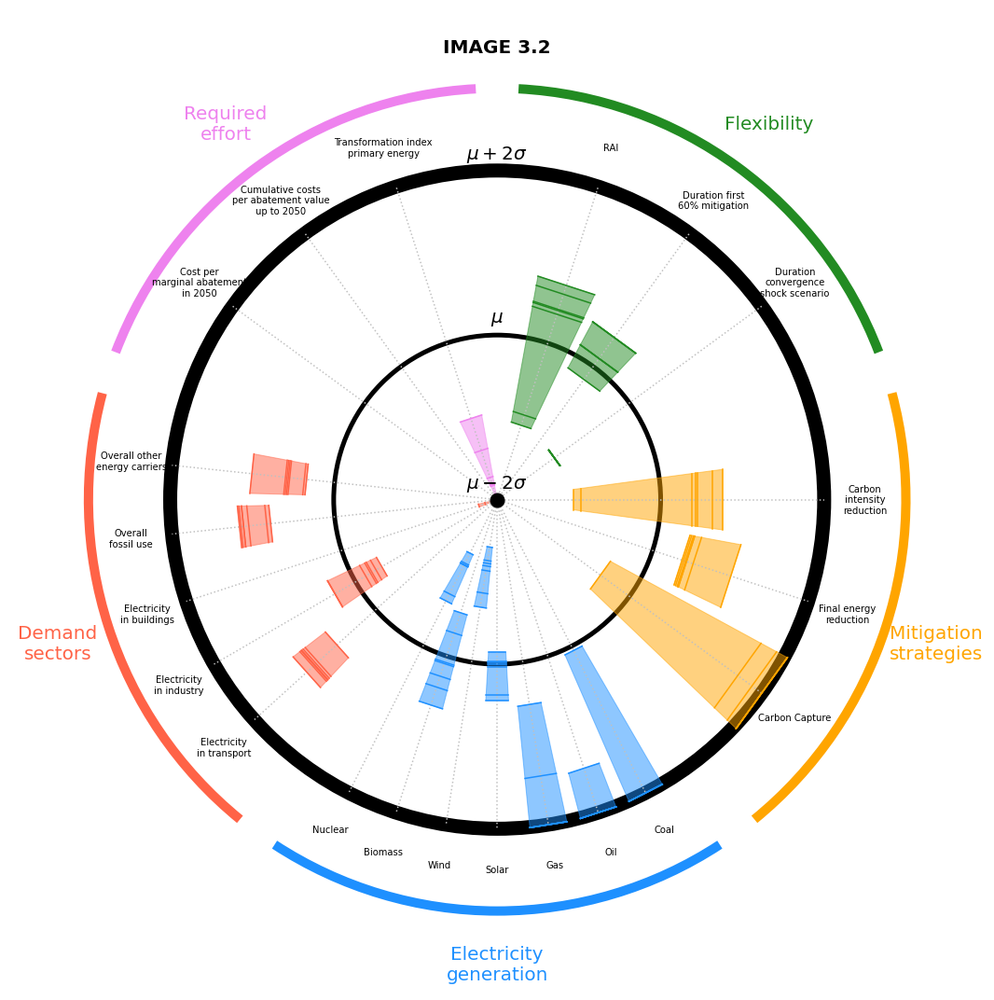

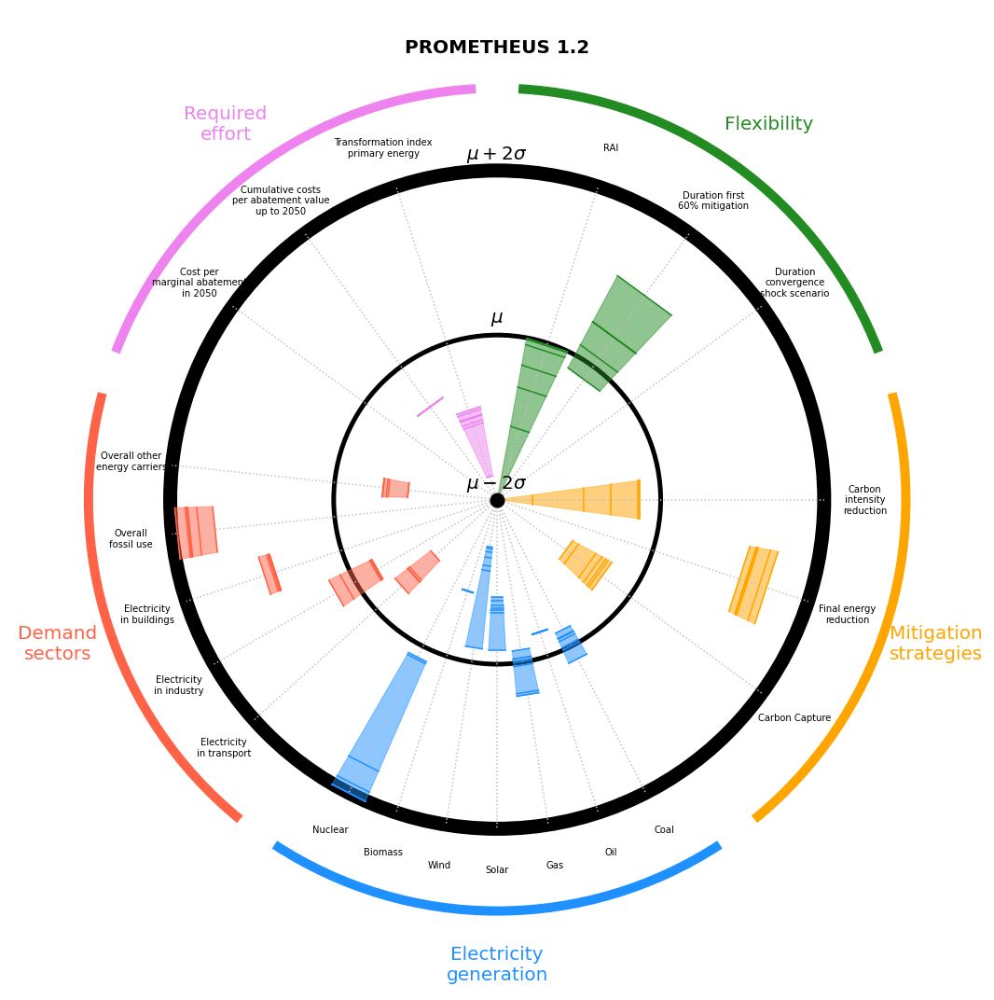

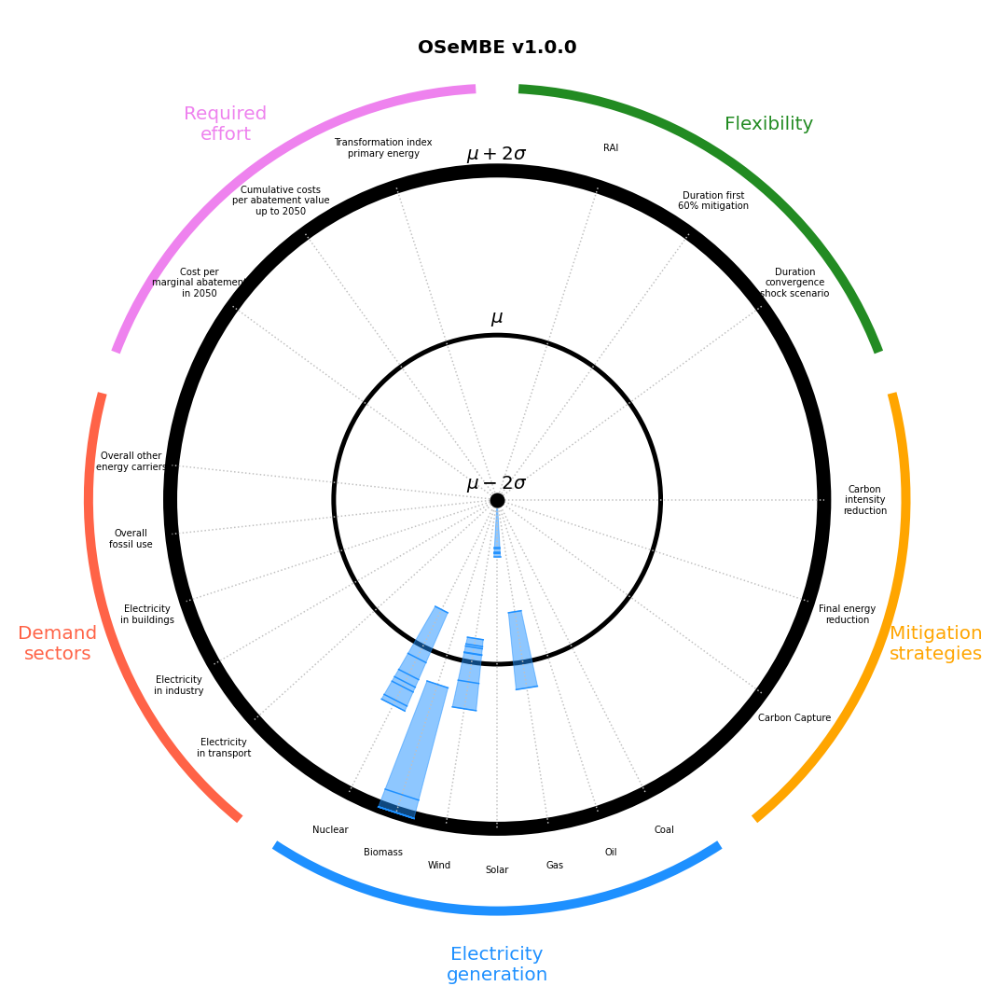

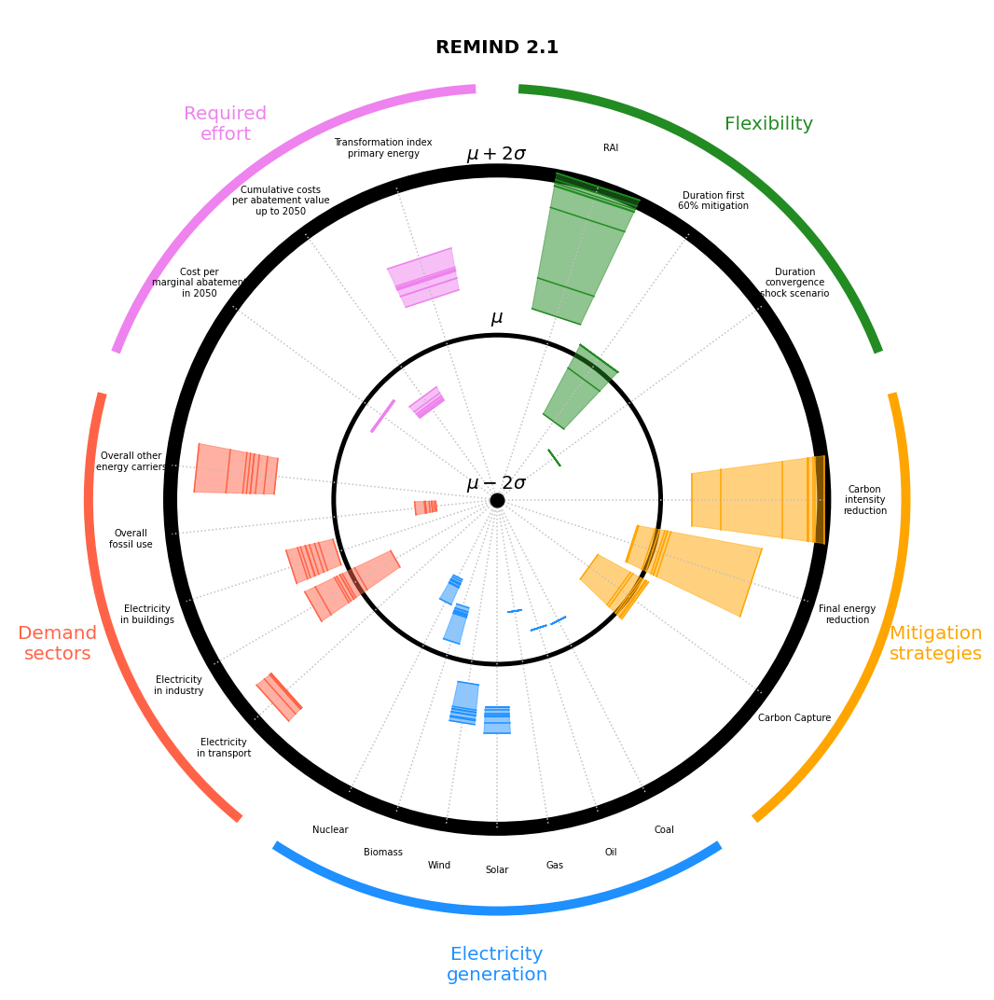

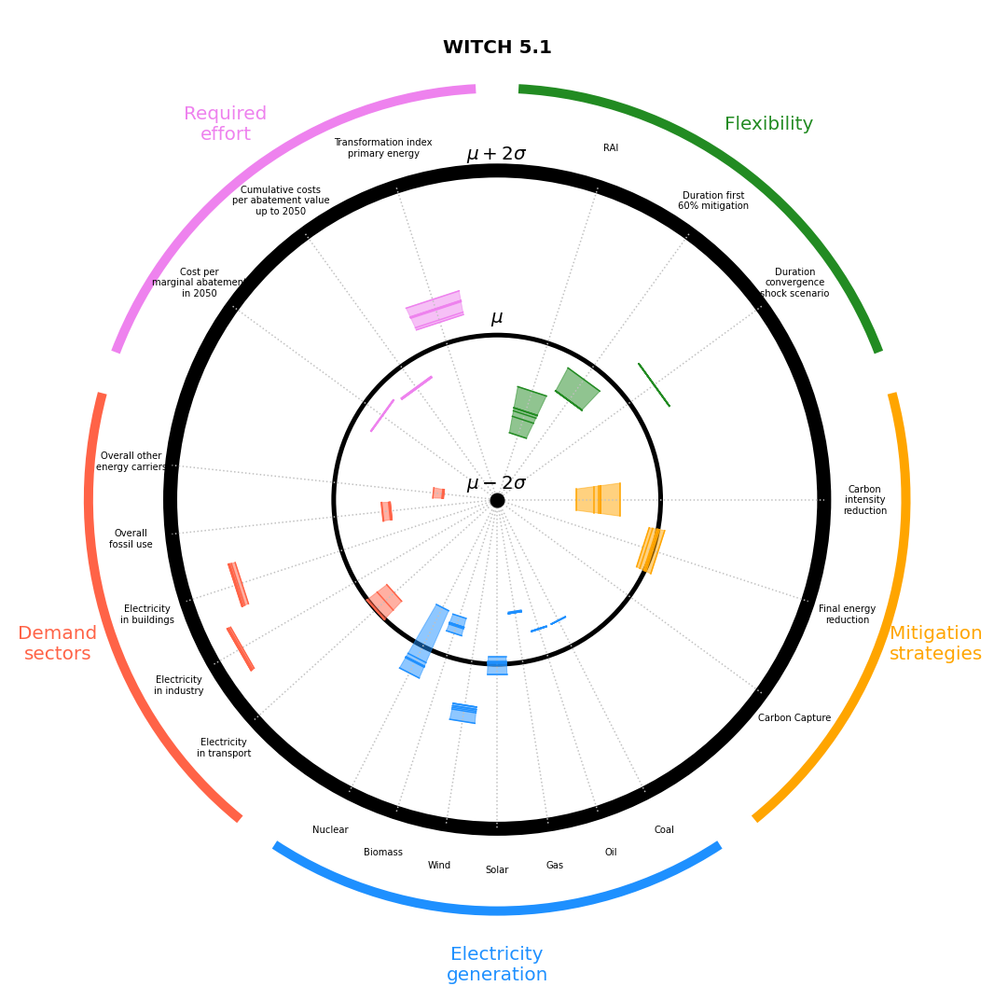

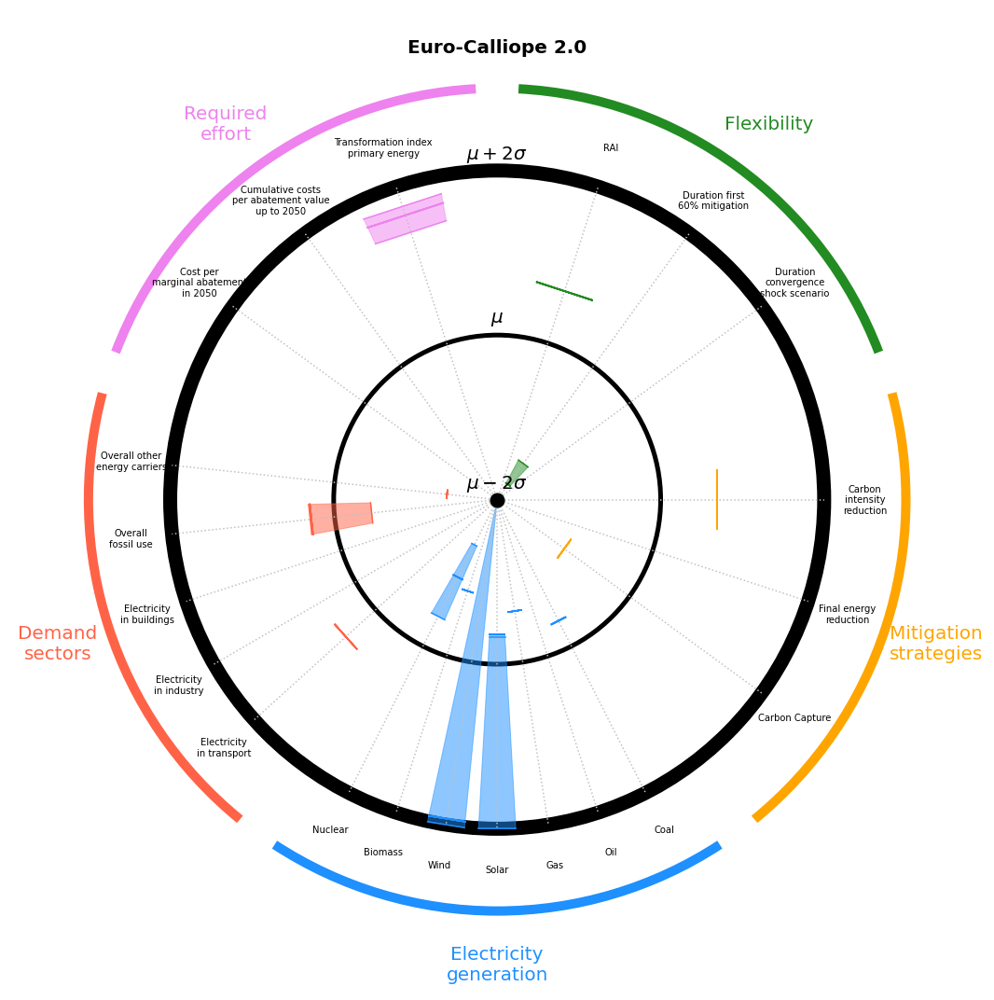

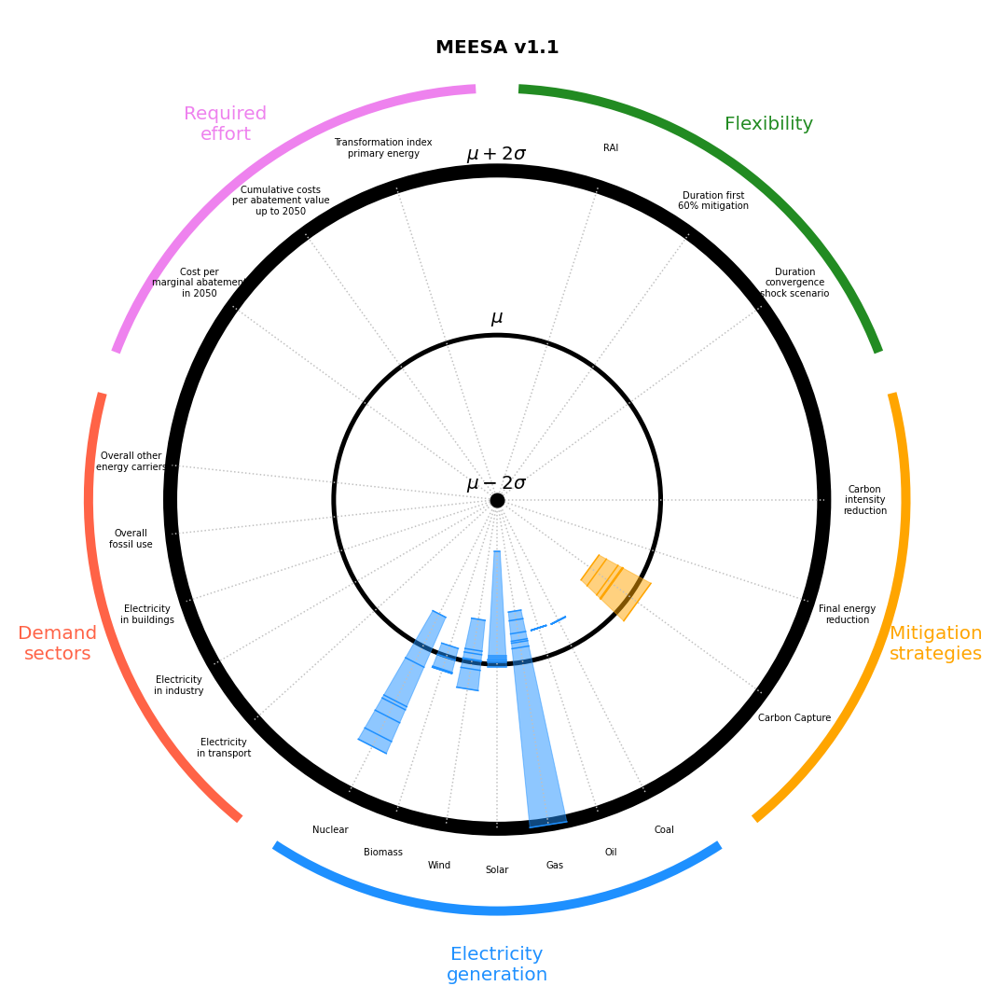

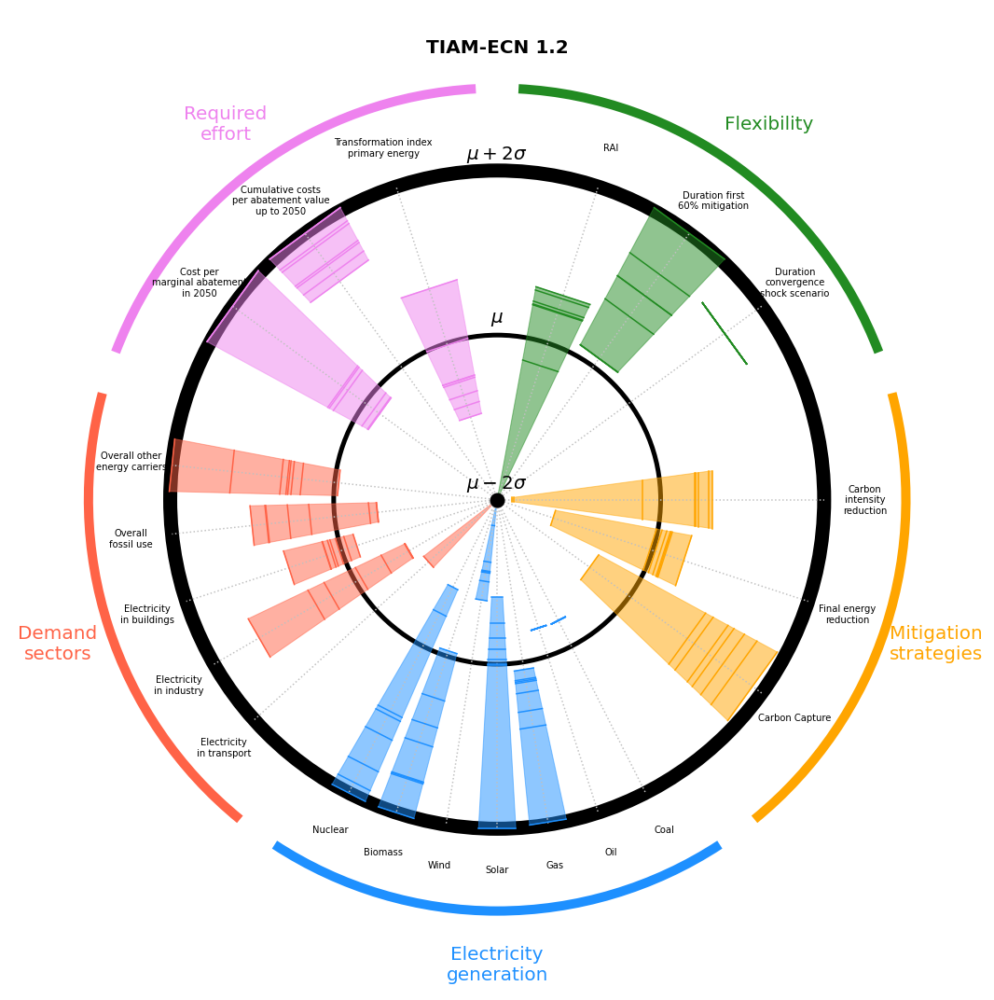

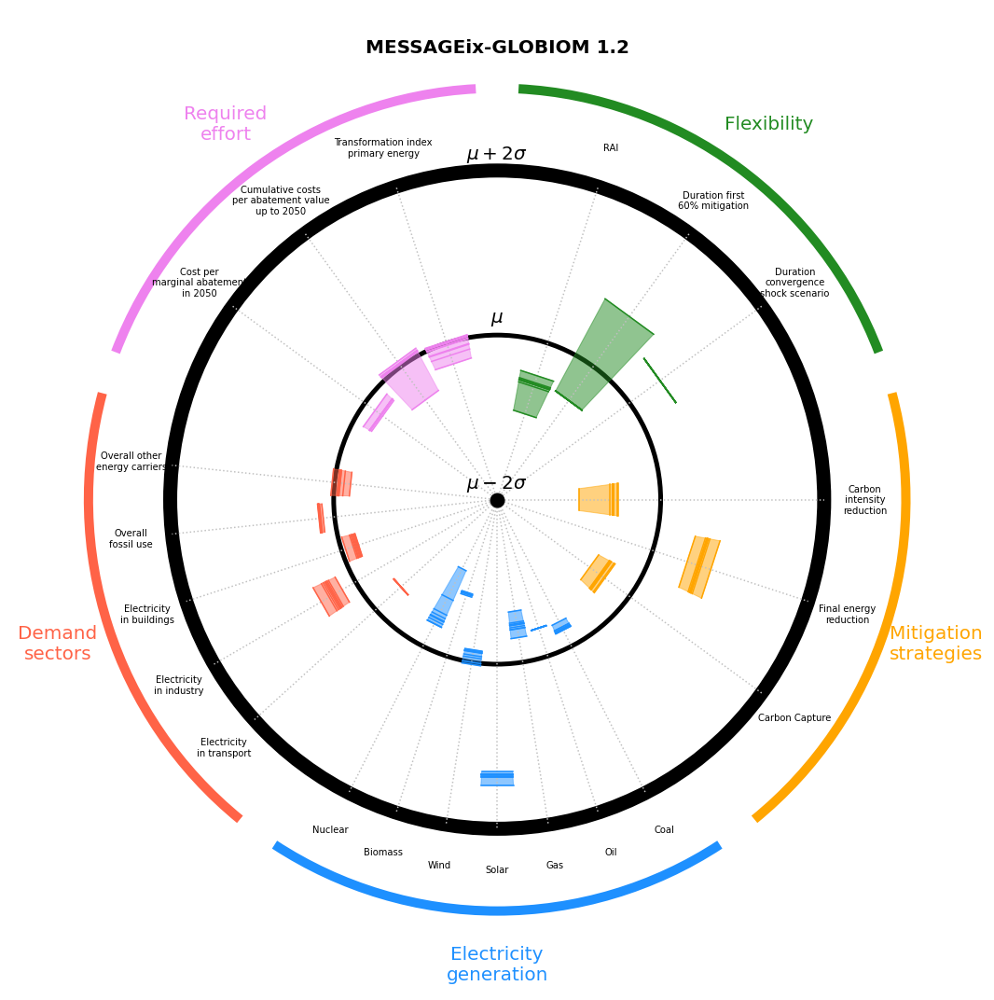

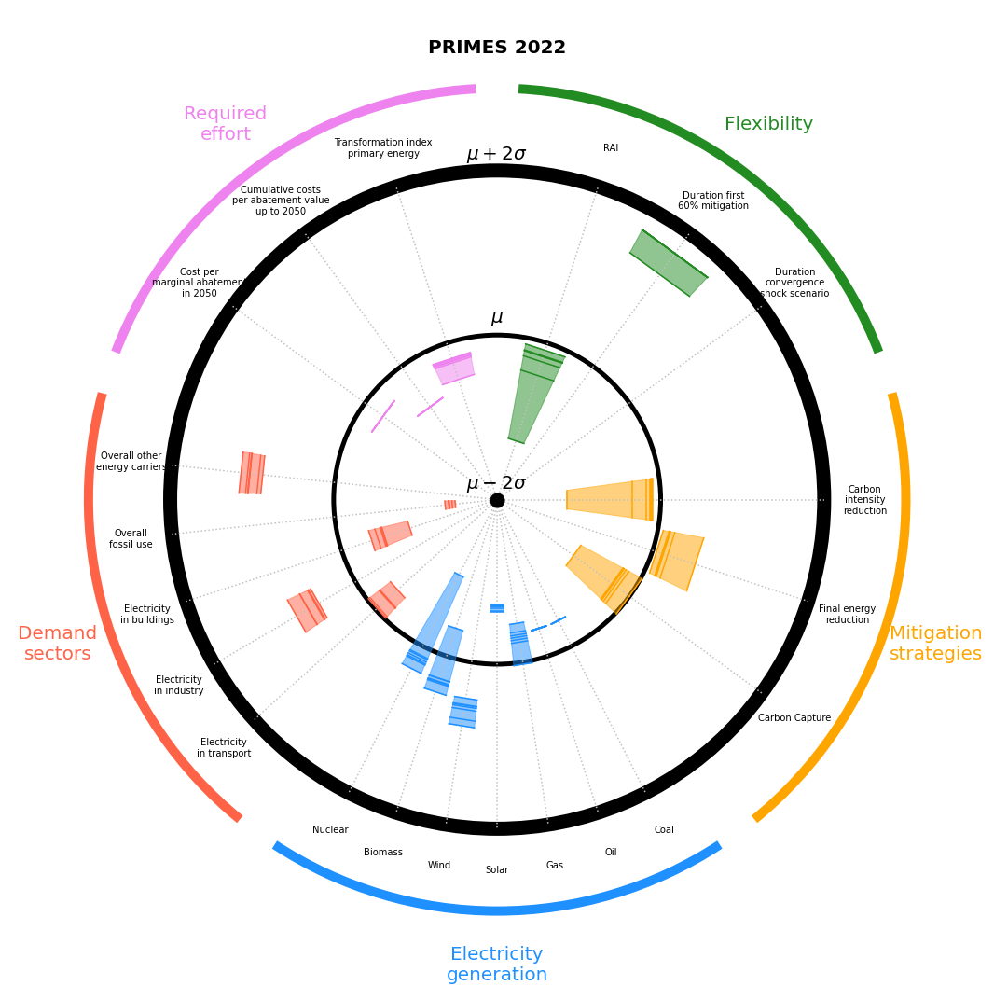

In [140]:
for model in tqdm(Models_touse):
        circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
        circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
        dr = 3
        vars = [["RAI", "ReactionTime", "Convergence"],
                ["CIred", "FEred", "CC"], # neg emis
                ["E_coal", "E_oil", "E_gas", "E_solar", "E_wind", "E_biomass2", "E_nuclear"],
                ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
                ["CAV", "CAVcum", "TI"]
                ]
        names = [["RAI", "Duration first\n60% mitigation", "Duration\nconvergence\nshock scenario"],
                ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon Capture"],
                ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
                ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Overall\nfossil use", "Overall other\nenergy carriers"],
                ["Cost per\nmarginal abatement\nin 2050", "Cumulative costs\nper abatement value\nup to 2050", "Transformation index\nprimary energy"]]
        cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
        incr = 360/len(vars)
        da = (90 - 360/len(vars))
        arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
        arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
        arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
        arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
        arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)

        fig, ax = plt.subplots(1, 1, figsize=(15, 15))
        ax.add_patch(circle_border)
        ax.add_patch(circle_average)
        ax.add_patch(arc_outer_1)
        ax.add_patch(arc_outer_2)
        ax.add_patch(arc_outer_3)
        ax.add_patch(arc_outer_4)
        ax.add_patch(arc_outer_5)
        ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)

        # Actual data
        time = 2050
        for vl_i, vl in enumerate(vars):
                for var_i, var in enumerate(vl):
                        pas = []
                        pbs = []
                        vals = []
                        if var == "E_biomass" and model == "IMAGE 3.2":
                                var = "E_biomass2"
                        for scen in c400lins:
                                angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                mean = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].mean())
                                std = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].std())
                                min = mean - 2*std
                                max = mean + 2*std
                                valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var])
                                val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                val = np.max([0, val])
                                val = np.min([0.8, val])
                                p = point(angle, val)
                                #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                pas.append(pa)
                                pbs.append(pb)
                                vals.append(val)
                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=cols[vl_i], zorder=1e9)

                                if scen == "DIAG-C400-lin":
                                        p0 = point(angle, 0.4*2)
                                        ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                        p0 = point(angle, 0.4*2+0.1)
                                        ax.text(p0[0], p0[1], names[vl_i][var_i], ha='center', va='center')
                                        #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                        #ax.add_patch(t1)
                        pas = np.array(pas)
                        pbs = np.array(pbs)
                        vals = np.array(vals)
                        if np.nansum(vals) != 0:
                                w_min = np.where(vals == np.nanmin(vals))[0][0]
                                w_max = np.where(vals == np.nanmax(vals))[0][0]

                                pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], alpha=0.5)
                                ax.add_patch(pol)

        ax.text(0.5, 0.52, r'$\mu-2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.72, r'$\mu$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.92, r'$\mu+2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)

        Cats = ["Flexibility", "Mitigation strategies", "Electricity generation", "Demand sectors", "Required effort"]
        for c_i, c in enumerate(Cats):
                p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
                cl = c.split(' ')
                if len(cl)>1:
                        c = cl[0]+'\n'+cl[1]
                        ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
                else:
                        ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

        # Other
        ax.text(0.5, 1.05, model, fontsize=20, ha='center', va='center', weight='bold')
        ax.set_xlim([-0.1, 1.1])
        ax.set_ylim([-0.1, 1.1])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])

        plt.tight_layout()
        plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/Models/WindRose_"+model[:3]+".png", dpi = 200, bbox_inches = "tight")

Separate figures: PE

100%|██████████| 10/10 [00:33<00:00,  3.33s/it]


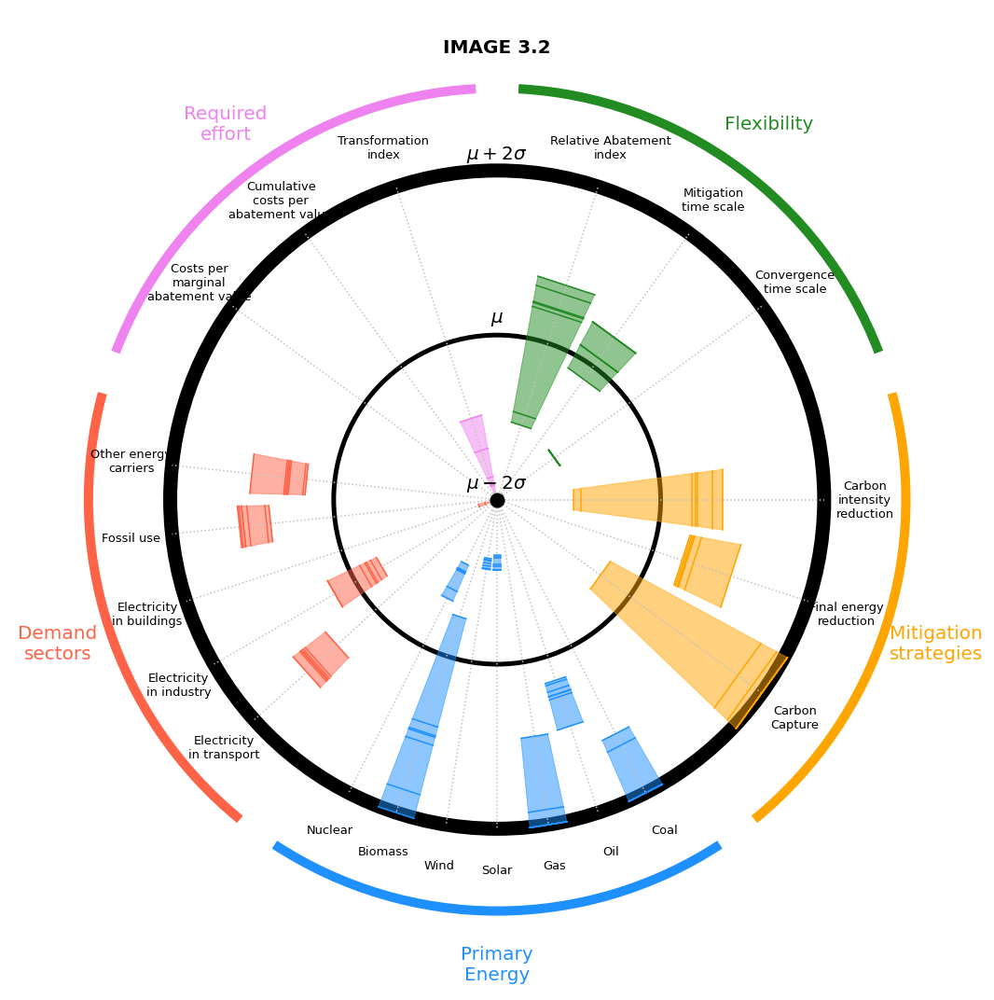

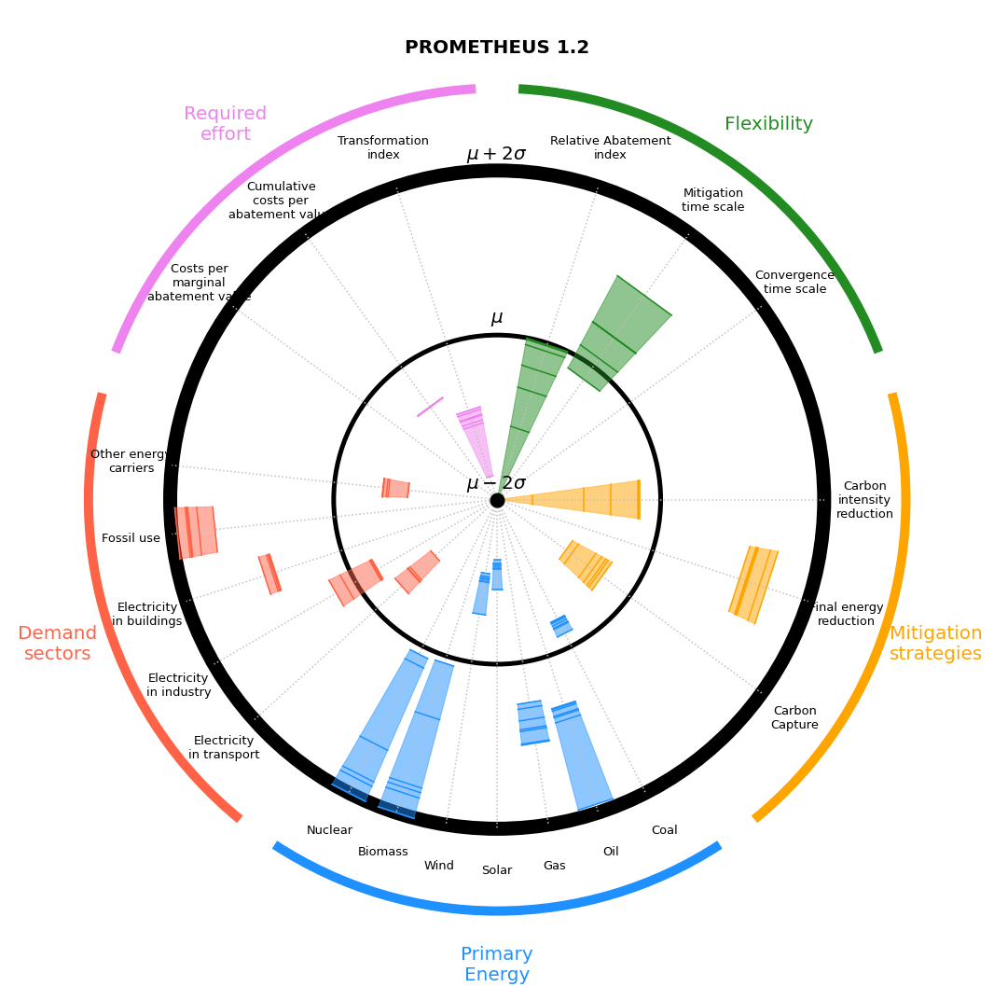

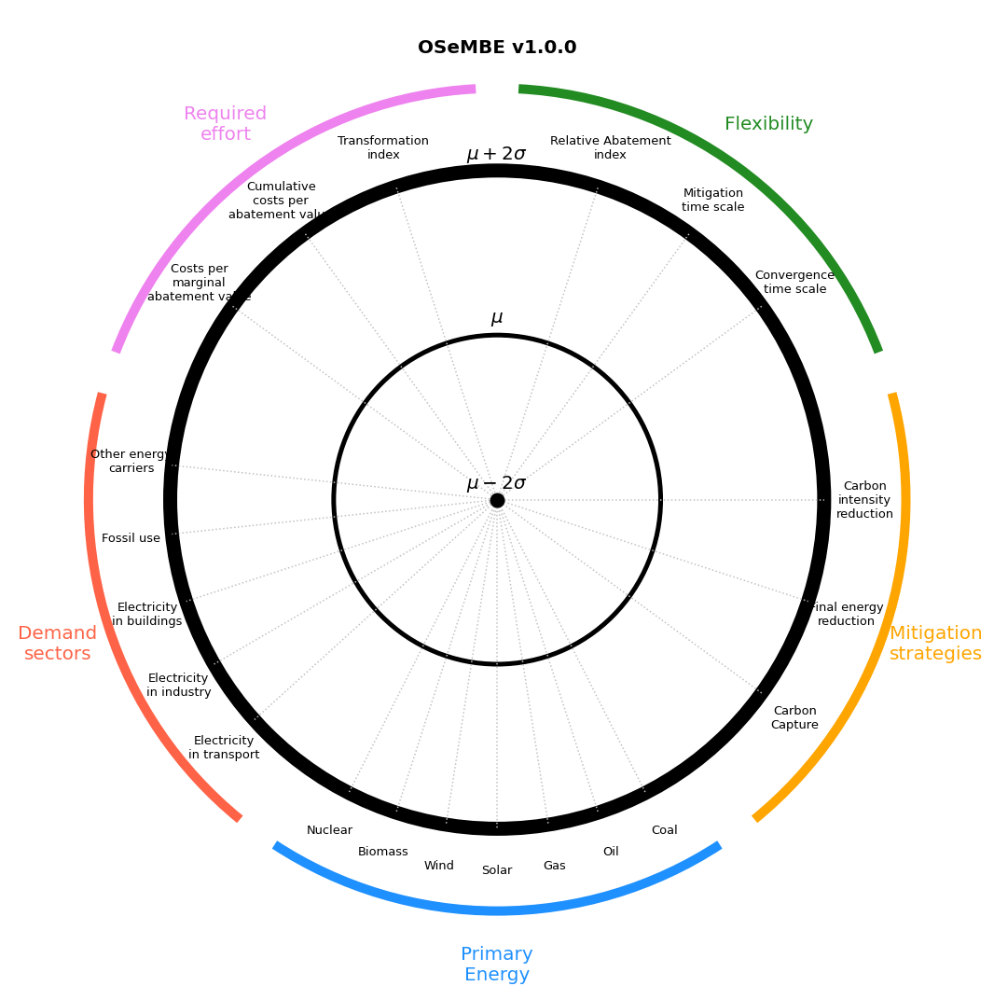

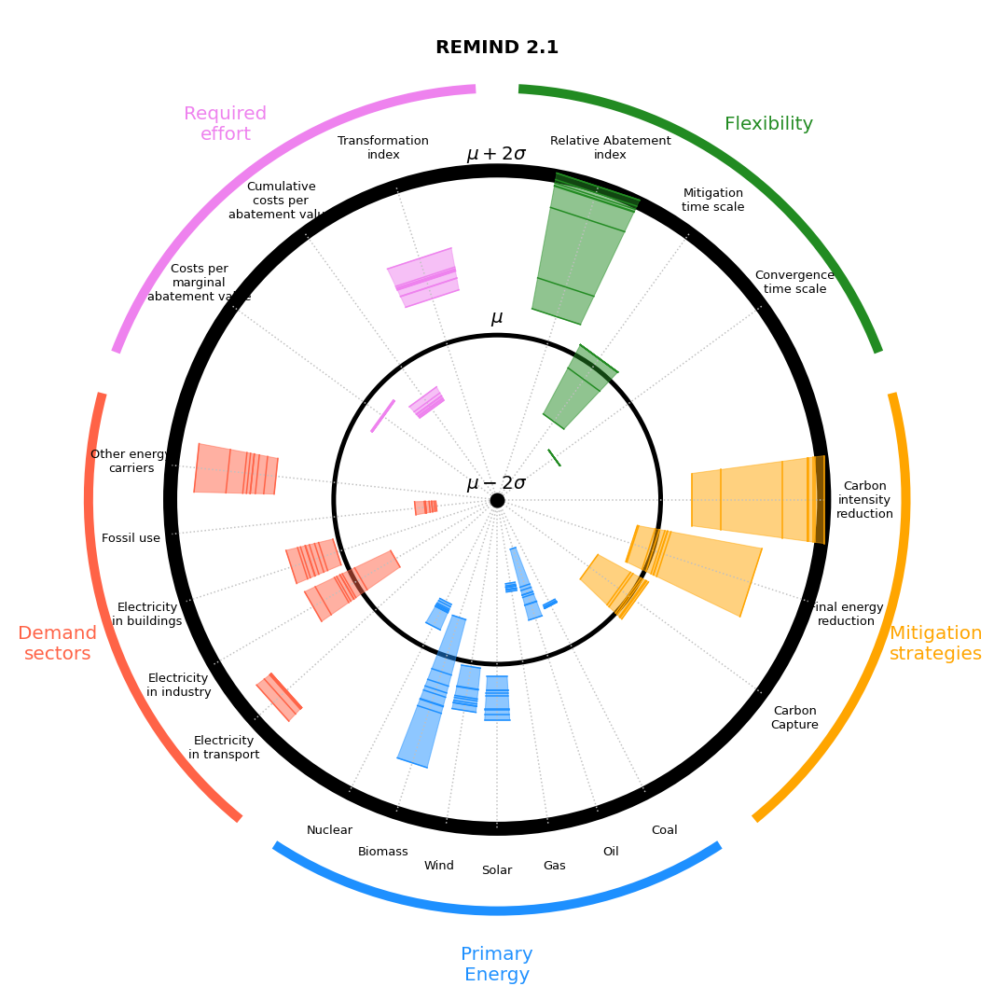

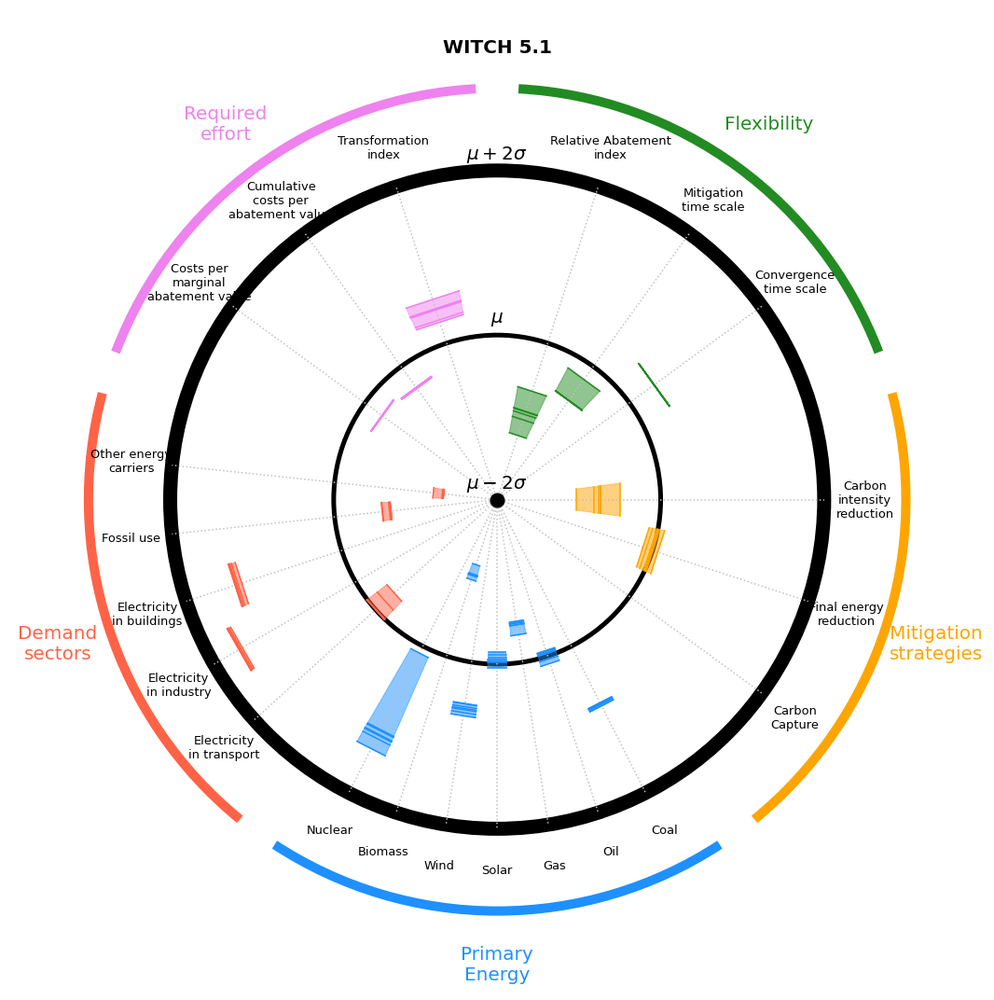

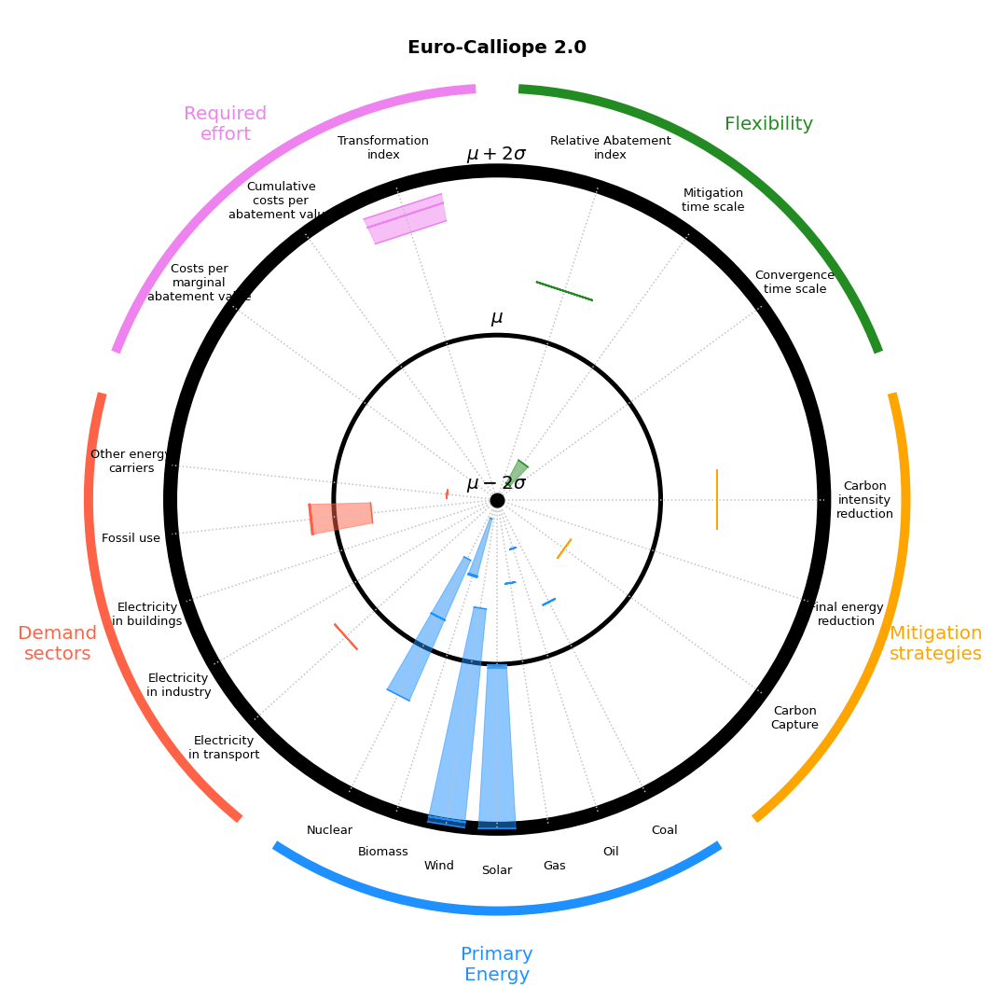

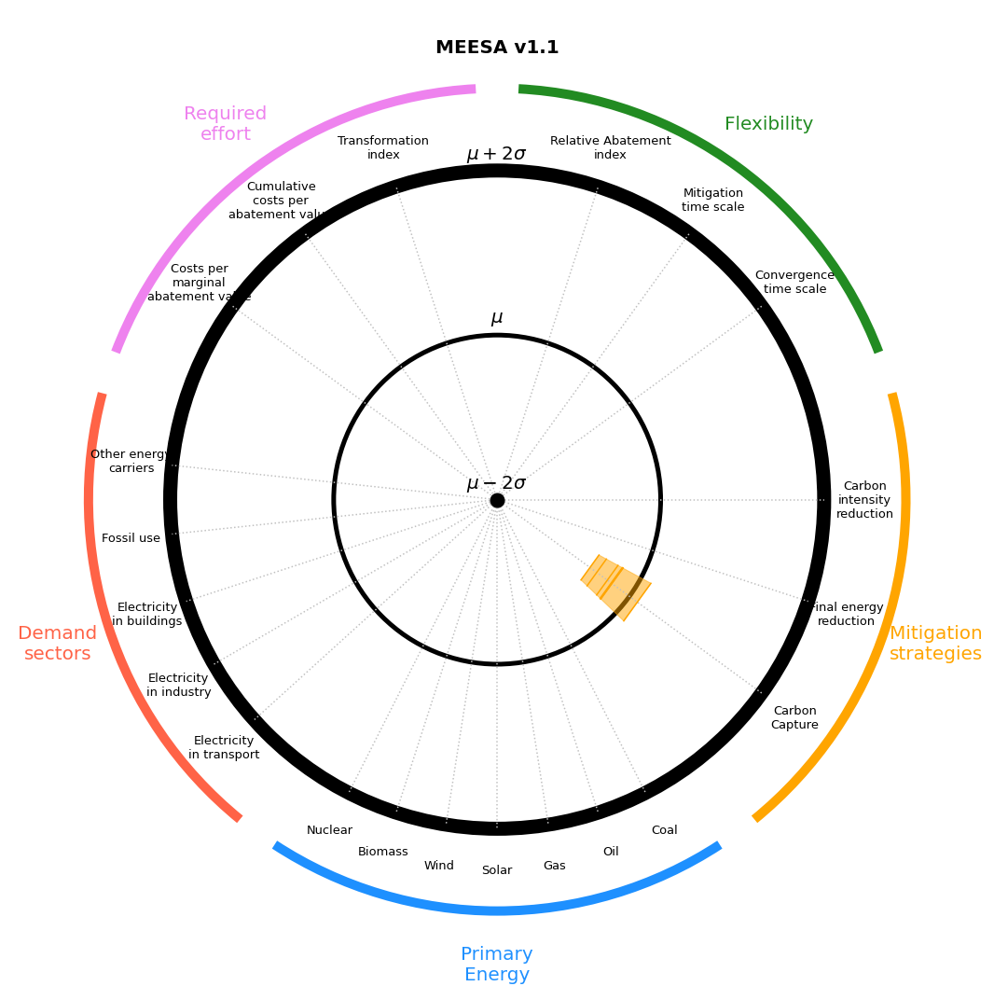

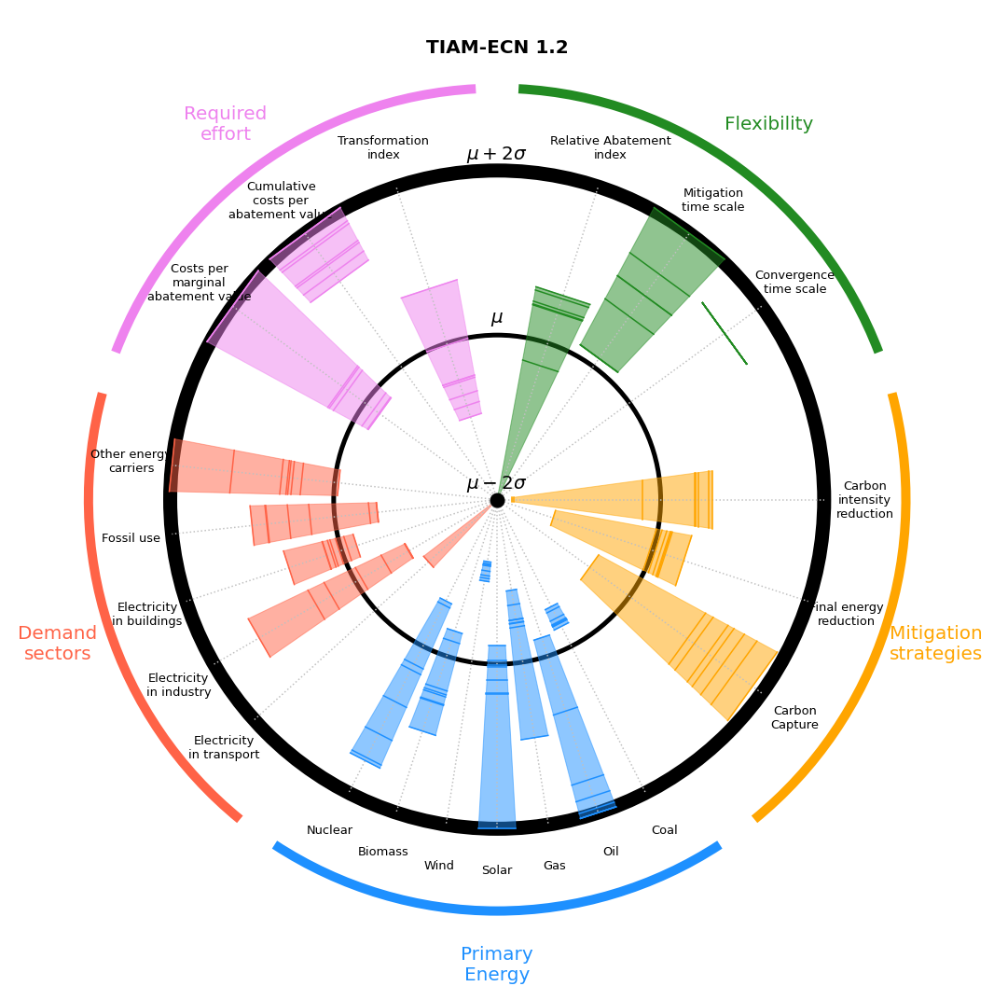

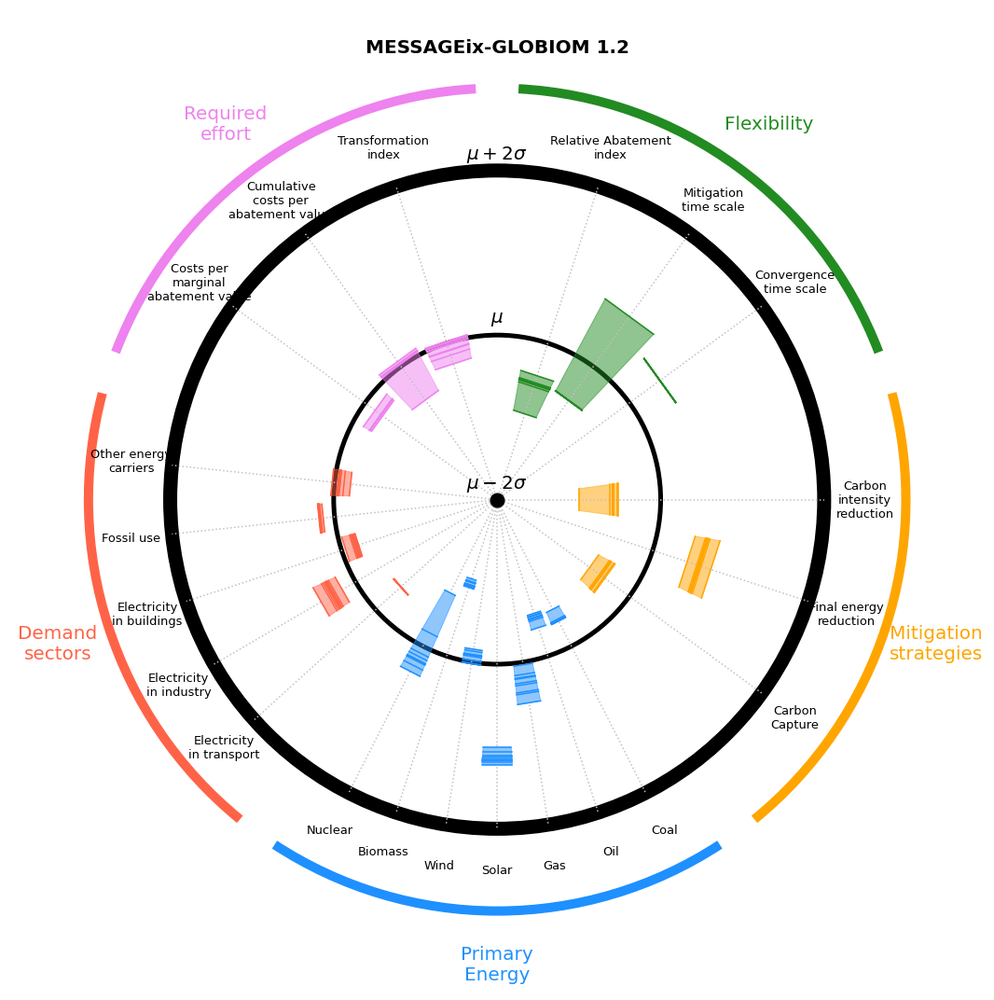

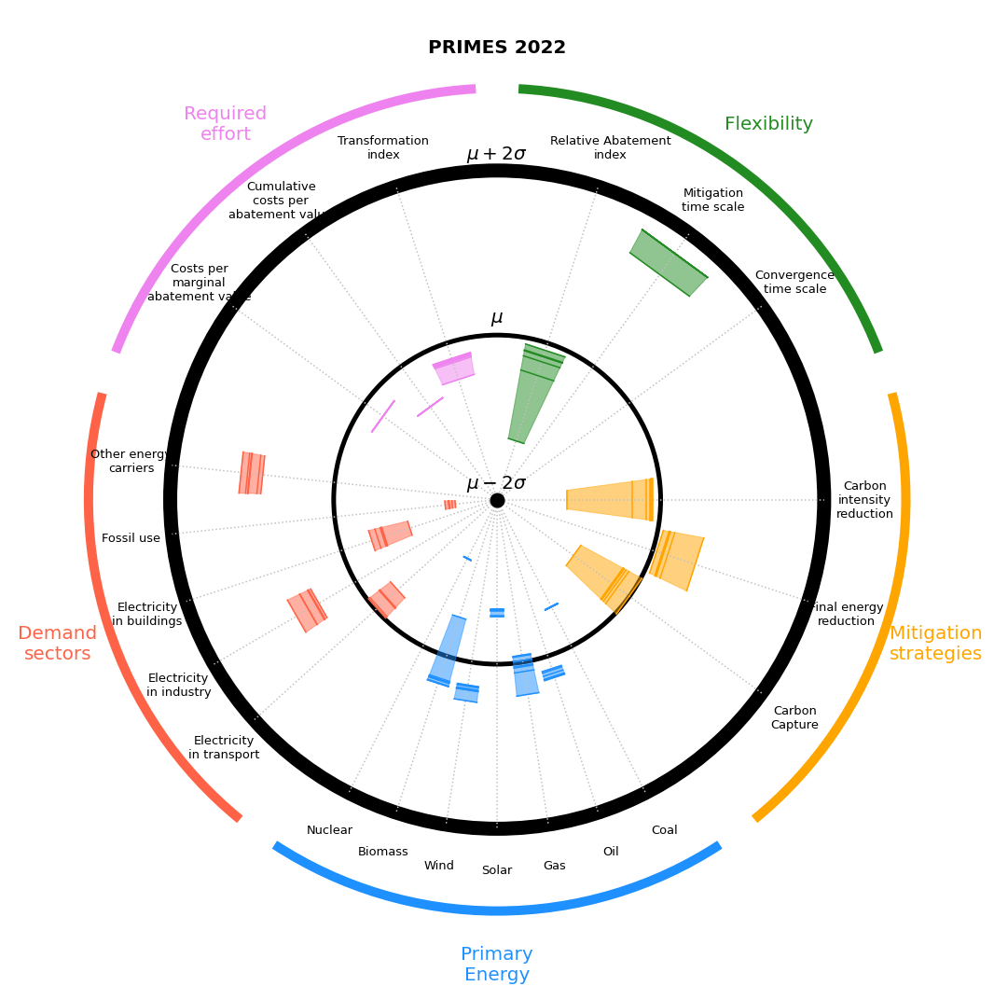

In [141]:
for model in tqdm(Models_touse):
        circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
        circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
        dr = 3
        vars = [["RAI", "ReactionTime", "Convergence"],
                ["CIred", "FEred", "CC"], # neg emis
                ["P_coal", "P_oil", "P_gas", "P_solar", "P_wind", "P_biomass", "P_nuclear"],
                ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
                ["CAV", "CAVcum", "TI"]
                ]
        names = [["Relative Abatement\nindex", "Mitigation\ntime scale", "Convergence\ntime scale"],
                ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon\nCapture"],
                ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
                ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Fossil use", "Other energy\ncarriers"],
                ["Costs per\nmarginal\nabatement value", "Cumulative\ncosts per\nabatement value", "Transformation\nindex"]]
        cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
        incr = 360/len(vars)
        da = (90 - 360/len(vars))
        arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
        arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
        arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
        arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
        arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)

        fig, ax = plt.subplots(1, 1, figsize=(15, 15))
        ax.add_patch(circle_border)
        ax.add_patch(circle_average)
        ax.add_patch(arc_outer_1)
        ax.add_patch(arc_outer_2)
        ax.add_patch(arc_outer_3)
        ax.add_patch(arc_outer_4)
        ax.add_patch(arc_outer_5)
        ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)

        # Actual data
        time = 2050
        for vl_i, vl in enumerate(vars):
                for var_i, var in enumerate(vl):
                        pas = []
                        pbs = []
                        vals = []
                        for scen in c400lins:
                                angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                mean = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].mean())
                                std = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].std())
                                min = mean - 2*std
                                max = mean + 2*std
                                valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var])
                                val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                val = np.max([0, val])
                                val = np.min([0.8, val])
                                p = point(angle, val)
                                #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                pas.append(pa)
                                pbs.append(pb)
                                vals.append(val)
                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=cols[vl_i], zorder=1e9)

                                if scen == "DIAG-C400-lin":
                                        p0 = point(angle, 0.4*2)
                                        ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                        p0 = point(angle, 0.4*2+0.1)
                                        ax.text(p0[0], p0[1], names[vl_i][var_i], fontsize=13, ha='center', va='center')
                                        #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                        #ax.add_patch(t1)
                        pas = np.array(pas)
                        pbs = np.array(pbs)
                        vals = np.array(vals)
                        if np.nansum(vals) != 0:
                                w_min = np.where(vals == np.nanmin(vals))[0][0]
                                w_max = np.where(vals == np.nanmax(vals))[0][0]

                                pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], alpha=0.5)
                                ax.add_patch(pol)

        ax.text(0.5, 0.52, r'$\mu-2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.72, r'$\mu$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.92, r'$\mu+2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)

        Cats = ["Flexibility", "Mitigation strategies", "Primary Energy", "Demand sectors", "Required effort"]
        for c_i, c in enumerate(Cats):
                p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
                cl = c.split(' ')
                if len(cl)>1:
                        c = cl[0]+'\n'+cl[1]
                        ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
                else:
                        ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

        # Other
        ax.text(0.5, 1.05, model, fontsize=20, ha='center', va='center', weight='bold')
        ax.set_xlim([-0.1, 1.1])
        ax.set_ylim([-0.1, 1.1])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])

        plt.tight_layout()
        plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/ModelsPE/WindRose_"+model[:3]+".png", dpi = 200, bbox_inches = "tight")

In [142]:
dr = 3
vars = [["RAI", "ReactionTime", "Convergence"],
        ["CIred", "FEred", "CC"], # neg emis
        ["E_coal", "E_oil", "E_gas", "E_solar", "E_wind", "E_biomass2", "E_nuclear"],
        ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
        ["CAV", "CAVcum", "TI"]
        ]
names = [["RAI", "Duration first\n60% mitigation", "Duration\nconvergence\nshock scenario"],
        ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon Capture"],
        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
        ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Overall\nfossil use", "Overall other\nenergy carriers"],
        ["Cost per\nmarginal abatement\nin 2050", "Cumulative costs\nper abatement value\nup to 2050", "Transformation index\nprimary energy"]]
cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
incr = 360/len(vars)
da = (90 - 360/len(vars))

Electricity version (all scens)

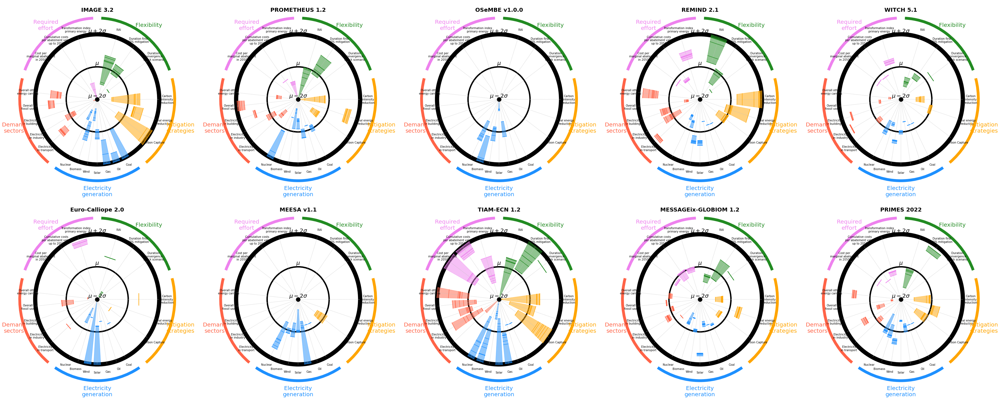

In [143]:
fig, ((ax1, ax2, ax3, ax4, ax5), (ax6, ax7, ax8, ax9, ax10)) = plt.subplots(2, 5, figsize=(50, 20))

for ax_i, ax in enumerate([ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10]):
    model = Models_touse[ax_i]
    circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
    circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
    arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
    arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
    arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
    arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
    arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)
    ax.add_patch(circle_border)
    ax.add_patch(circle_average)
    ax.add_patch(arc_outer_1)
    ax.add_patch(arc_outer_2)
    ax.add_patch(arc_outer_3)
    ax.add_patch(arc_outer_4)
    ax.add_patch(arc_outer_5)
    ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)
    
    # Actual data
    time = 2050
    for vl_i, vl in enumerate(vars):
                for var_i, var in enumerate(vl):
                        pas = []
                        pbs = []
                        vals = []
                        if var == "E_biomass" and model == "IMAGE 3.2":
                                var = "E_biomass2"
                        for scen in c400lins:
                                angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                mean = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].mean())
                                std = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].std())
                                min = mean - 2*std
                                max = mean + 2*std
                                valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var])
                                val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                val = np.max([0, val])
                                val = np.min([0.8, val])
                                p = point(angle, val)
                                #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                pas.append(pa)
                                pbs.append(pb)
                                vals.append(val)
                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=cols[vl_i], zorder=1e9)

                                if scen == "DIAG-C400-lin":
                                        p0 = point(angle, 0.4*2)
                                        ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                        p0 = point(angle, 0.4*2+0.1)
                                        ax.text(p0[0], p0[1], names[vl_i][var_i], ha='center', va='center')
                                        #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                        #ax.add_patch(t1)
                        pas = np.array(pas)
                        pbs = np.array(pbs)
                        vals = np.array(vals)
                        if np.nansum(vals) != 0:
                                w_min = np.where(vals == np.nanmin(vals))[0][0]
                                w_max = np.where(vals == np.nanmax(vals))[0][0]

                                pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], alpha=0.5)
                                ax.add_patch(pol)

    
    ax.text(0.5, 0.52, r'$\mu-2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)
    ax.text(0.5, 0.72, r'$\mu$', fontsize=20, ha='center', va='center', zorder=1e999)
    ax.text(0.5, 0.92, r'$\mu+2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)

    Cats = ["Flexibility", "Mitigation strategies", "Electricity generation", "Demand sectors", "Required effort"]
    for c_i, c in enumerate(Cats):
            p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
            cl = c.split(' ')
            if len(cl)>1:
                    c = cl[0]+'\n'+cl[1]
                    ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
            else:
                    ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

    # Other
    ax.text(0.5, 1.05, model, fontsize=20, ha='center', va='center', weight='bold')
    ax.set_xlim([-0.1, 1.1])
    ax.set_ylim([-0.1, 1.1])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])


fig.tight_layout()
plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/WindRoses_all.png", dpi = 200, bbox_inches = "tight")

PE version (all scens): 4 columns

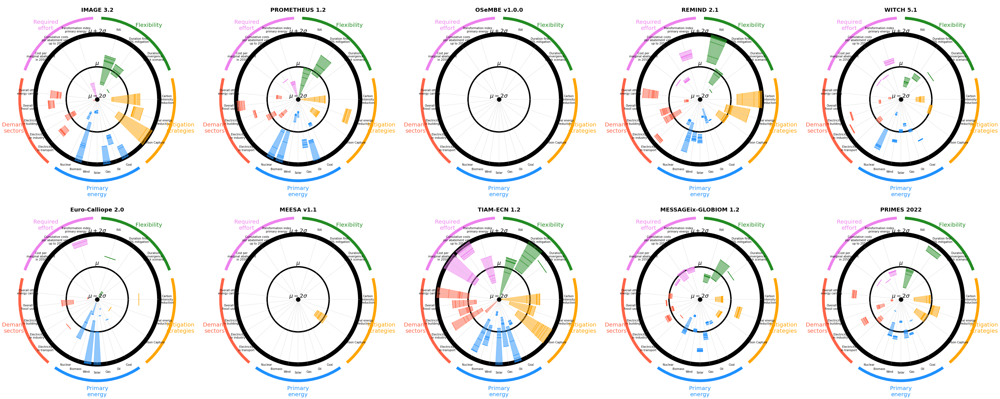

In [144]:
dr = 3
vars = [["RAI", "ReactionTime", "Convergence"],
        ["CIred", "FEred", "CC"], # neg emis
        ["P_coal", "P_oil", "P_gas", "P_solar", "P_wind", "P_biomass", "P_nuclear"],
        ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
        ["CAV", "CAVcum", "TI"]
        ]
names = [["RAI", "Duration first\n60% mitigation", "Duration\nconvergence\nshock scenario"],
        ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon Capture"],
        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
        ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Overall\nfossil use", "Overall other\nenergy carriers"],
        ["Cost per\nmarginal abatement\nin 2050", "Cumulative costs\nper abatement value\nup to 2050", "Transformation index\nprimary energy"]]
cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
incr = 360/len(vars)
da = (90 - 360/len(vars))

fig, ((ax1, ax2, ax3, ax4, ax5), (ax6, ax7, ax8, ax9, ax10)) = plt.subplots(2, 5, figsize=(50, 20))

for ax_i, ax in enumerate([ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10]):
    model = Models_touse[ax_i]
    circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
    circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
    arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
    arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
    arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
    arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
    arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)
    ax.add_patch(circle_border)
    ax.add_patch(circle_average)
    ax.add_patch(arc_outer_1)
    ax.add_patch(arc_outer_2)
    ax.add_patch(arc_outer_3)
    ax.add_patch(arc_outer_4)
    ax.add_patch(arc_outer_5)
    ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)
    
    # Actual data
    time = 2050
    for vl_i, vl in enumerate(vars):
                for var_i, var in enumerate(vl):
                        pas = []
                        pbs = []
                        vals = []
                        if var == "E_biomass" and model == "IMAGE 3.2":
                                var = "E_biomass2"
                        for scen in c400lins:
                                angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                mean = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].mean())
                                std = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].std())
                                min = mean - 2*std
                                max = mean + 2*std
                                valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var])
                                val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                val = np.max([0, val])
                                val = np.min([0.8, val])
                                p = point(angle, val)
                                #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                pas.append(pa)
                                pbs.append(pb)
                                vals.append(val)
                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=cols[vl_i], zorder=1e9)

                                if scen == "DIAG-C400-lin":
                                        p0 = point(angle, 0.4*2)
                                        ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                        p0 = point(angle, 0.4*2+0.1)
                                        ax.text(p0[0], p0[1], names[vl_i][var_i], ha='center', va='center')
                                        #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                        #ax.add_patch(t1)
                        pas = np.array(pas)
                        pbs = np.array(pbs)
                        vals = np.array(vals)
                        if np.nansum(vals) != 0:
                                w_min = np.where(vals == np.nanmin(vals))[0][0]
                                w_max = np.where(vals == np.nanmax(vals))[0][0]

                                pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], alpha=0.5)
                                ax.add_patch(pol)

    
    ax.text(0.5, 0.52, r'$\mu-2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)
    ax.text(0.5, 0.72, r'$\mu$', fontsize=20, ha='center', va='center', zorder=1e999)
    ax.text(0.5, 0.92, r'$\mu+2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)

    Cats = ["Flexibility", "Mitigation strategies", "Primary energy", "Demand sectors", "Required effort"]
    for c_i, c in enumerate(Cats):
            p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
            cl = c.split(' ')
            if len(cl)>1:
                    c = cl[0]+'\n'+cl[1]
                    ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
            else:
                    ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

    # Other
    ax.text(0.5, 1.05, model, fontsize=20, ha='center', va='center', weight='bold')
    ax.set_xlim([-0.1, 1.1])
    ax.set_ylim([-0.1, 1.1])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])


fig.tight_layout()
#plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/WindRoses_all_pe.png", dpi = 200, bbox_inches = "tight")

PE version (all scens): 4 rows

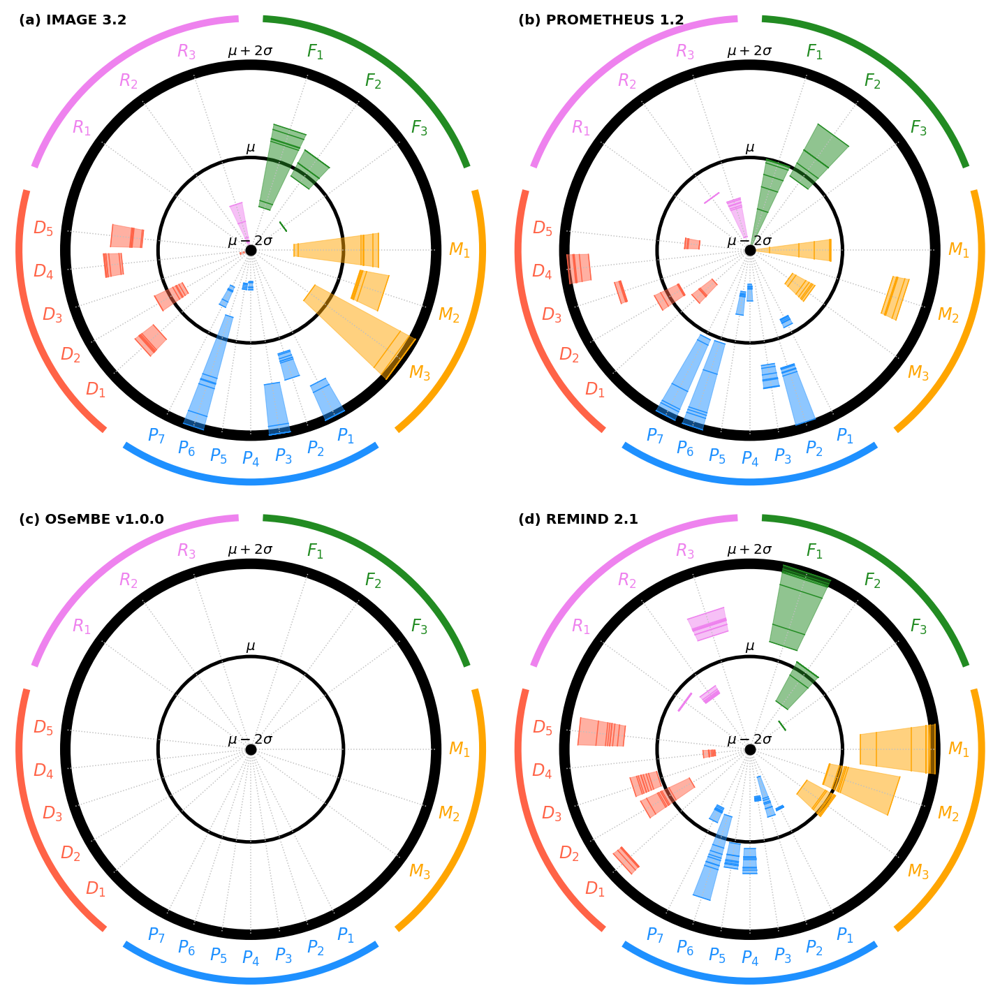

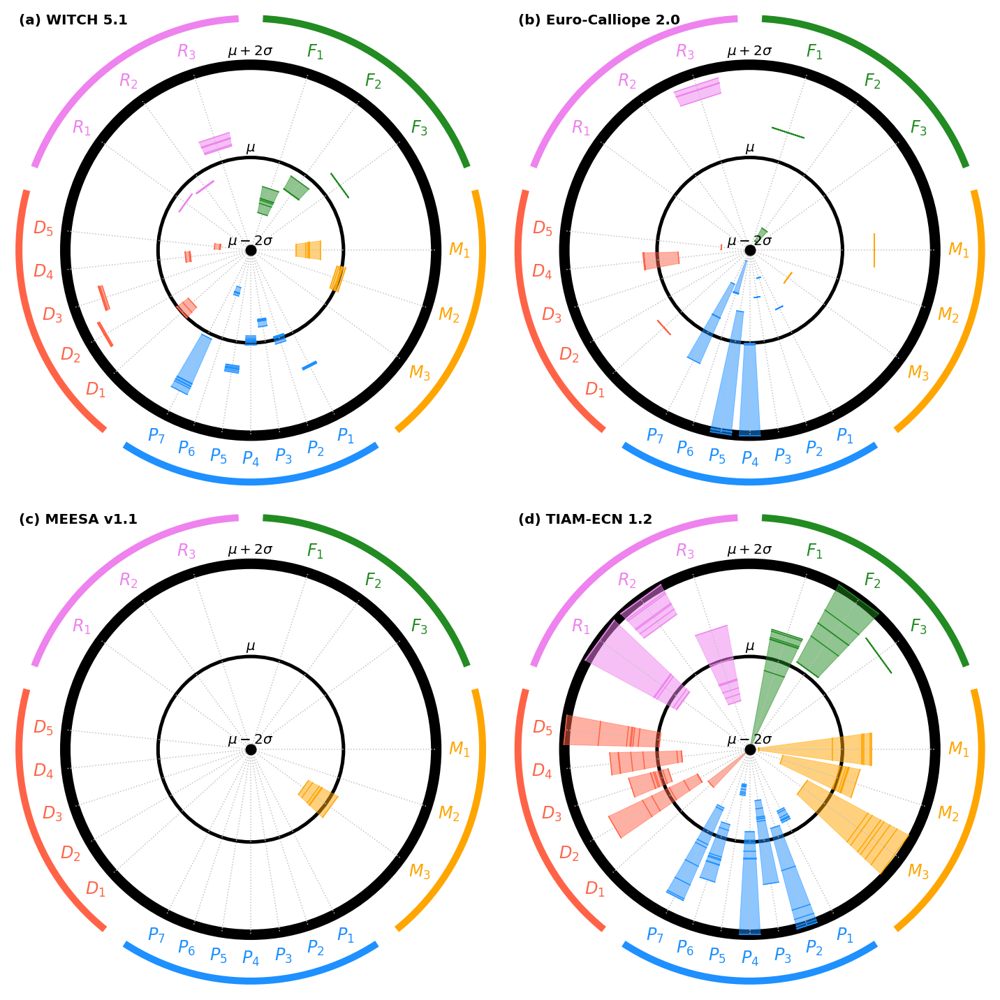

In [145]:
dr = 3
vars = [["RAI", "ReactionTime", "Convergence"],
        ["CIred", "FEred", "CC"], # neg emis
        ["P_coal", "P_oil", "P_gas", "P_solar", "P_wind", "P_biomass", "P_nuclear"],
        ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
        ["CAV", "CAVcum", "TI"]
        ]
names = [["RAI", "Duration first\n60% mitigation", "Duration\nconvergence\nshock scenario"],
        ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon Capture"],
        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
        ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Overall\nfossil use", "Overall other\nenergy carriers"],
        ["Cost per\nmarginal abatement\nin 2050", "Cumulative costs\nper abatement value\nup to 2050", "Transformation index\nprimary energy"]]
cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
incr = 360/len(vars)
da = (90 - 360/len(vars))

names2 = [[r"$F_1$", r"$F_2$", r"$F_3$"],
        [r"$M_1$", r"$M_2$", r"$M_3$"],
        [r"$P_1$", r"$P_2$", r"$P_3$", r"$P_4$", r"$P_5$", r"$P_6$", r"$P_7$"],
        [r"$D_1$", r"$D_2$", r"$D_3$",r"$D_4$", r"$D_5$"],
        [r"$R_1$", r"$R_2$", r"$R_3$"]]

#fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(30, 30))
#fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8)) = plt.subplots(4, 2, figsize=(20, 40))
for fig_i in [0, 1]:
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))

        for ax_i, ax in enumerate([ax1, ax2, ax3, ax4]):
                model = Models_touse[int(ax_i+4*fig_i)]
                circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
                circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
                arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
                arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
                arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
                arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
                arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)
                ax.add_patch(circle_border)
                ax.add_patch(circle_average)
                ax.add_patch(arc_outer_1)
                ax.add_patch(arc_outer_2)
                ax.add_patch(arc_outer_3)
                ax.add_patch(arc_outer_4)
                ax.add_patch(arc_outer_5)
                ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)
                
                # Actual data
                time = 2050
                for vl_i, vl in enumerate(vars):
                                for var_i, var in enumerate(vl):
                                        pas = []
                                        pbs = []
                                        vals = []
                                        if var == "E_biomass" and model == "IMAGE 3.2":
                                                var = "E_biomass2"
                                        for scen in c400lins:
                                                angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                                mean = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].mean())
                                                std = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].std())
                                                min = mean - 2*std
                                                max = mean + 2*std
                                                valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var])
                                                val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                                val = np.max([0, val])
                                                val = np.min([0.8, val])
                                                p = point(angle, val)
                                                #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                                _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                                pas.append(pa)
                                                pbs.append(pb)
                                                vals.append(val)
                                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=cols[vl_i], zorder=1e9)

                                                if scen == "DIAG-C400-lin":
                                                        p0 = point(angle, 0.4*2)
                                                        ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                                        p0 = point(angle, 0.4*2+0.1)
                                                        ax.text(p0[0], p0[1], names2[vl_i][var_i], fontsize=24, c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ha='center', va='center')
                                                        #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                                        #ax.add_patch(t1)
                                        pas = np.array(pas)
                                        pbs = np.array(pbs)
                                        vals = np.array(vals)
                                        if np.nansum(vals) != 0:
                                                w_min = np.where(vals == np.nanmin(vals))[0][0]
                                                w_max = np.where(vals == np.nanmax(vals))[0][0]

                                                pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], alpha=0.5)
                                                ax.add_patch(pol)

                
                ax.text(0.5, 0.52, r'$\mu-2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)
                ax.text(0.5, 0.72, r'$\mu$', fontsize=20, ha='center', va='center', zorder=1e999)
                ax.text(0.5, 0.93, r'$\mu+2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)

                #     Cats = ["Flexibility", "Mitigation strategies", "Primary energy", "Demand sectors", "Required effort"]
                #     for c_i, c in enumerate(Cats):
                #             p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
                #             cl = c.split(' ')
                #             if len(cl)>1:
                #                     c = cl[0]+'\n'+cl[1]
                #                     ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
                #             else:
                #                     ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

                # Other
                ax.text(0.00, 1.01, ['(a)', "(b)", "(c)", "(d)"][ax_i]+' '+model, fontsize=20, ha='left', va='top', weight='bold')
                ax.set_xlim([-0.03, 1.03])
                ax.set_ylim([-0.03, 1.03])
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(False)
                ax.spines['left'].set_visible(False)
                ax.get_xaxis().set_ticks([])
                ax.get_yaxis().set_ticks([])


        fig.tight_layout()
        plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/Figure_"+str(fig_i+1+2)+".png", dpi = 200, bbox_inches = "tight")

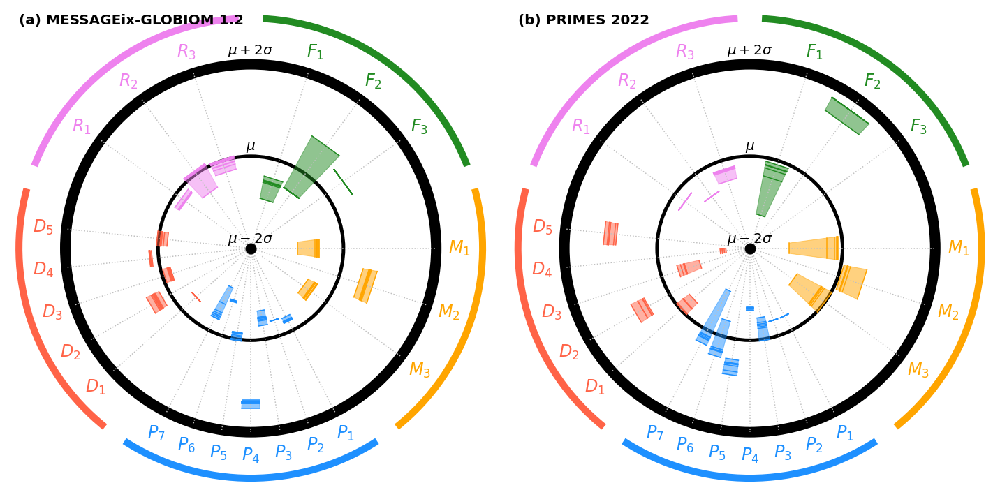

In [152]:
fig_i = 2

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

for ax_i, ax in enumerate([ax1, ax2]):
        model = Models_touse[int(ax_i+4*fig_i)]
        circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
        circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
        arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
        arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
        arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
        arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
        arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)
        ax.add_patch(circle_border)
        ax.add_patch(circle_average)
        ax.add_patch(arc_outer_1)
        ax.add_patch(arc_outer_2)
        ax.add_patch(arc_outer_3)
        ax.add_patch(arc_outer_4)
        ax.add_patch(arc_outer_5)
        ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)
        
        # Actual data
        time = 2050
        for vl_i, vl in enumerate(vars):
                        for var_i, var in enumerate(vl):
                                pas = []
                                pbs = []
                                vals = []
                                if var == "E_biomass" and model == "IMAGE 3.2":
                                        var = "E_biomass2"
                                for scen in c400lins:
                                        angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                        mean = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].mean())
                                        std = float(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var].std())
                                        min = mean - 2*std
                                        max = mean + 2*std
                                        valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var])
                                        val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                        val = np.max([0, val])
                                        val = np.min([0.8, val])
                                        p = point(angle, val)
                                        #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                        _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                        pas.append(pa)
                                        pbs.append(pb)
                                        vals.append(val)
                                        ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=cols[vl_i], zorder=1e9)

                                        if scen == "DIAG-C400-lin":
                                                p0 = point(angle, 0.4*2)
                                                ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                                p0 = point(angle, 0.4*2+0.1)
                                                ax.text(p0[0], p0[1], names2[vl_i][var_i], fontsize=24, c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ha='center', va='center')
                                                #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                                #ax.add_patch(t1)
                                pas = np.array(pas)
                                pbs = np.array(pbs)
                                vals = np.array(vals)
                                if np.nansum(vals) != 0:
                                        w_min = np.where(vals == np.nanmin(vals))[0][0]
                                        w_max = np.where(vals == np.nanmax(vals))[0][0]

                                        pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], alpha=0.5)
                                        ax.add_patch(pol)

        
        ax.text(0.5, 0.52, r'$\mu-2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.72, r'$\mu$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.93, r'$\mu+2\sigma$', fontsize=20, ha='center', va='center', zorder=1e999)

        #     Cats = ["Flexibility", "Mitigation strategies", "Primary energy", "Demand sectors", "Required effort"]
        #     for c_i, c in enumerate(Cats):
        #             p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
        #             cl = c.split(' ')
        #             if len(cl)>1:
        #                     c = cl[0]+'\n'+cl[1]
        #                     ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
        #             else:
        #                     ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

        # Other
        ax.text(0.00, 1.01, ['(a)', "(b)", "(c)", "(d)"][ax_i]+' '+model, fontsize=20, ha='left', va='top', weight='bold')
        ax.set_xlim([-0.03, 1.03])
        ax.set_ylim([-0.03, 1.03])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])


fig.tight_layout()
plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/Figure_5.png", dpi = 200, bbox_inches = "tight")

### For individual scenarios -> Deviations

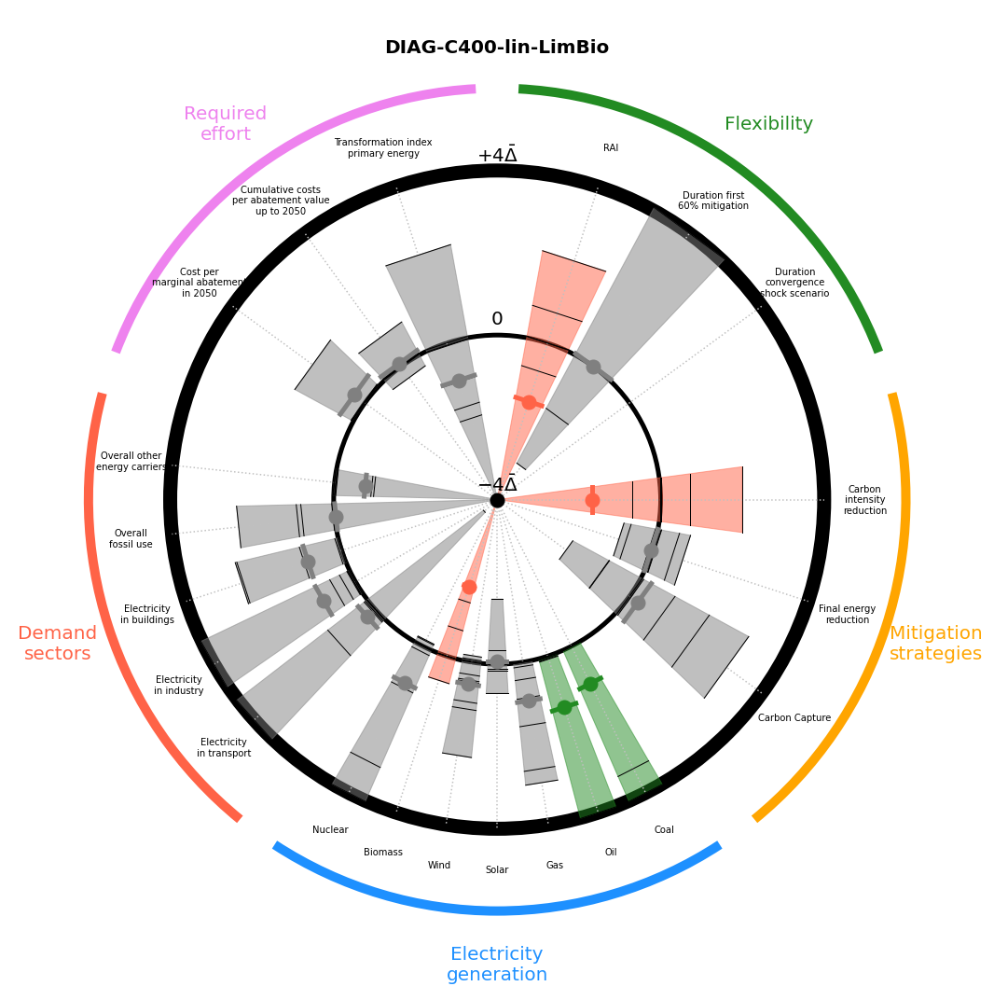

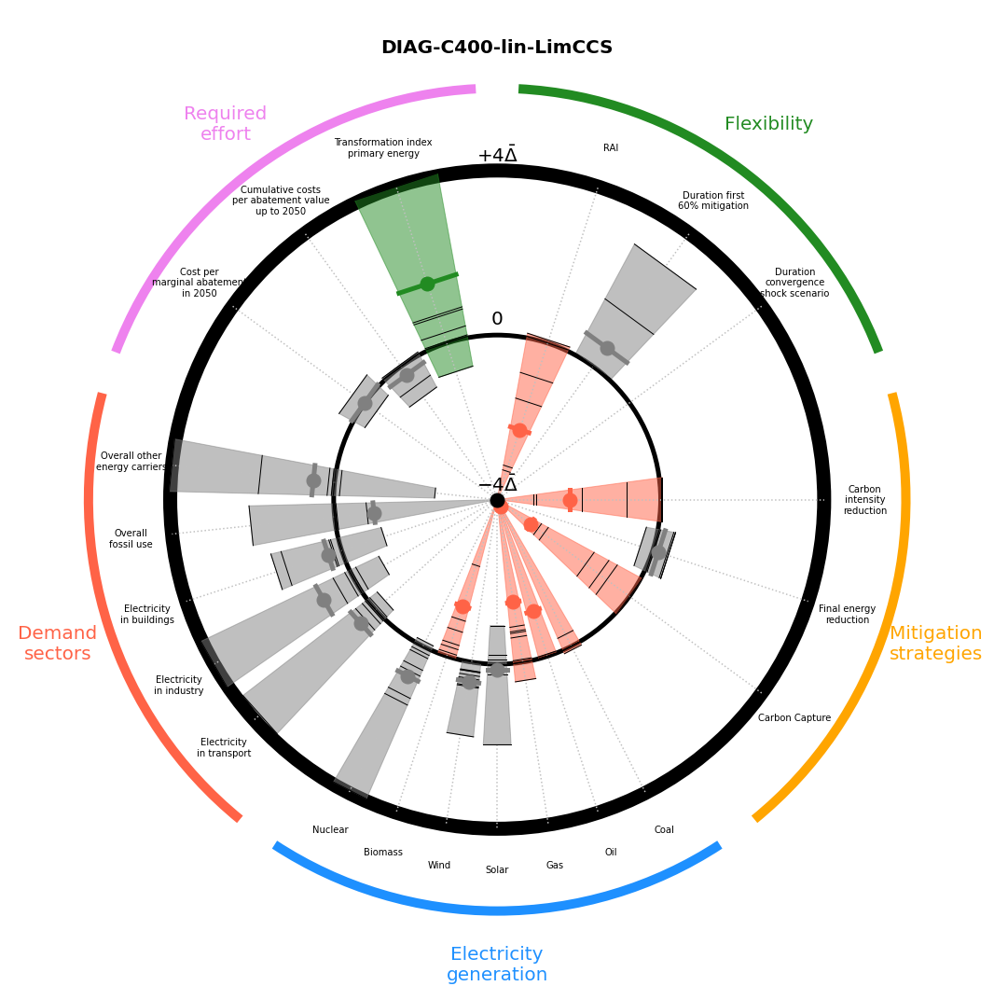

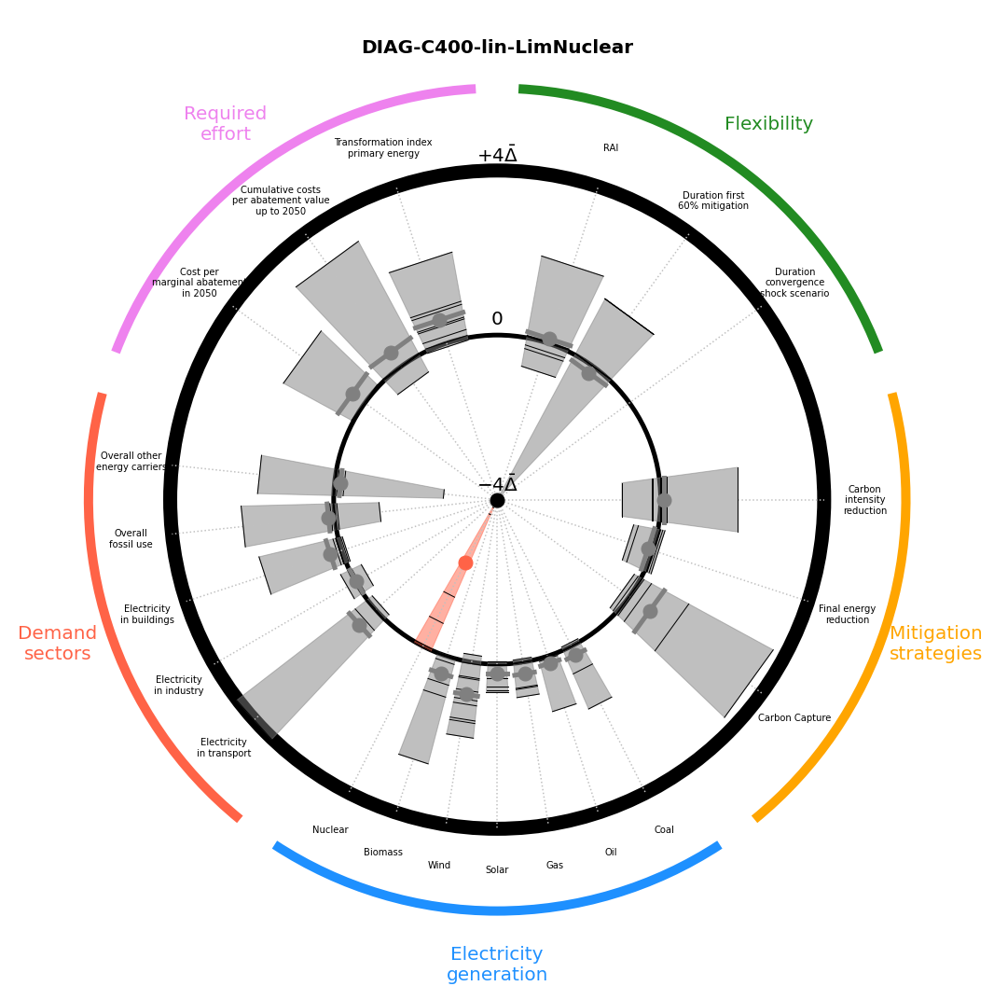

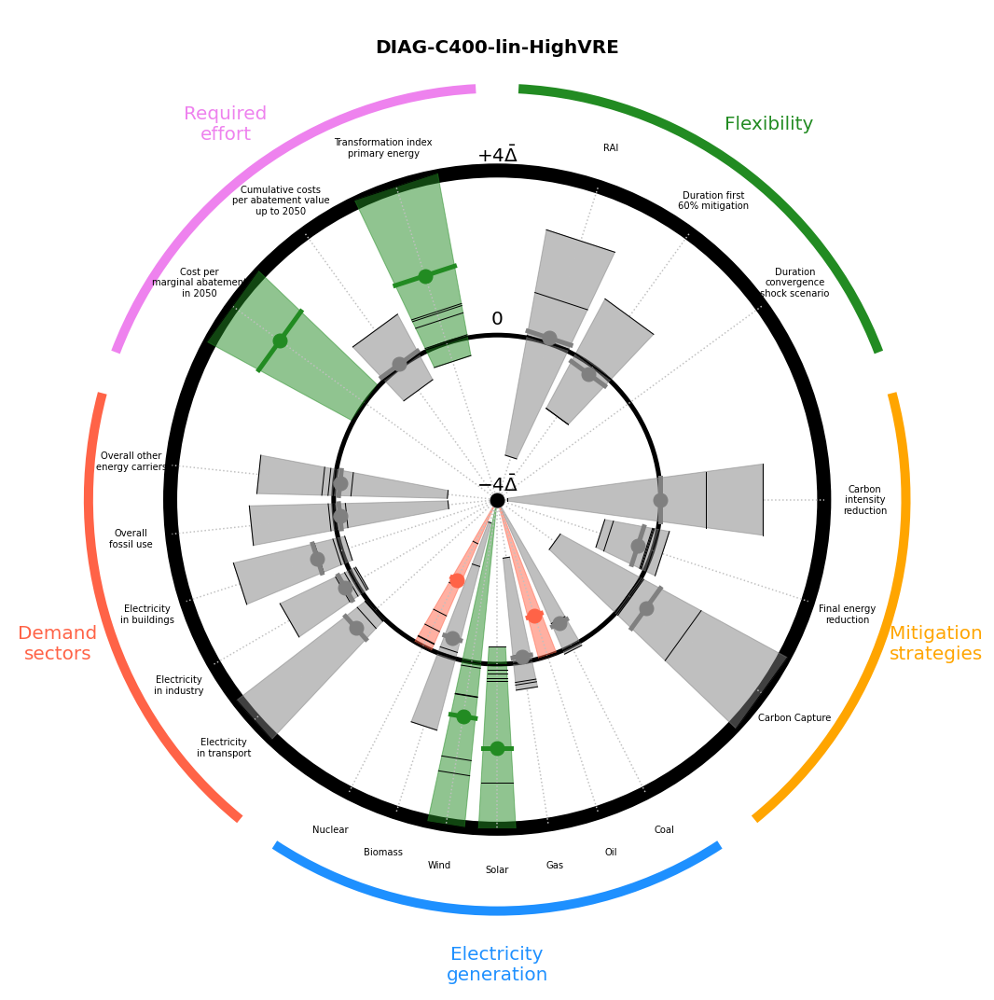

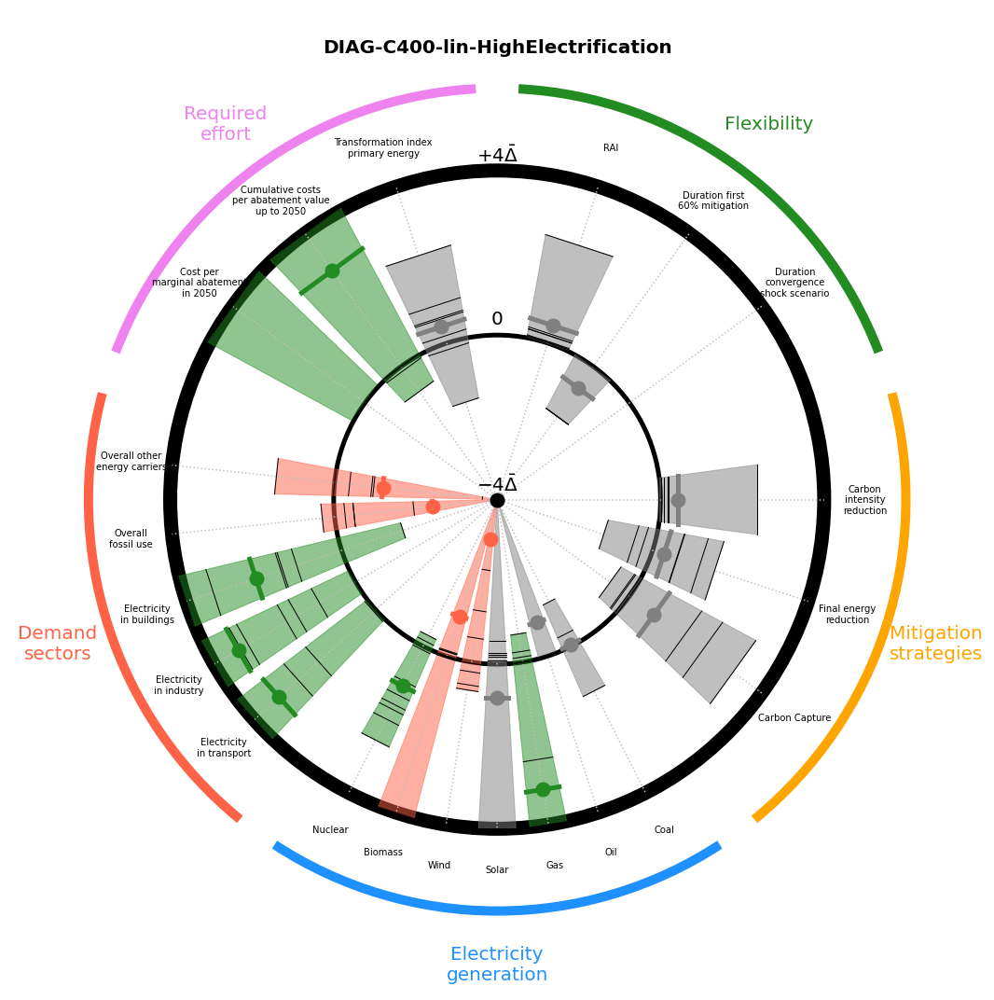

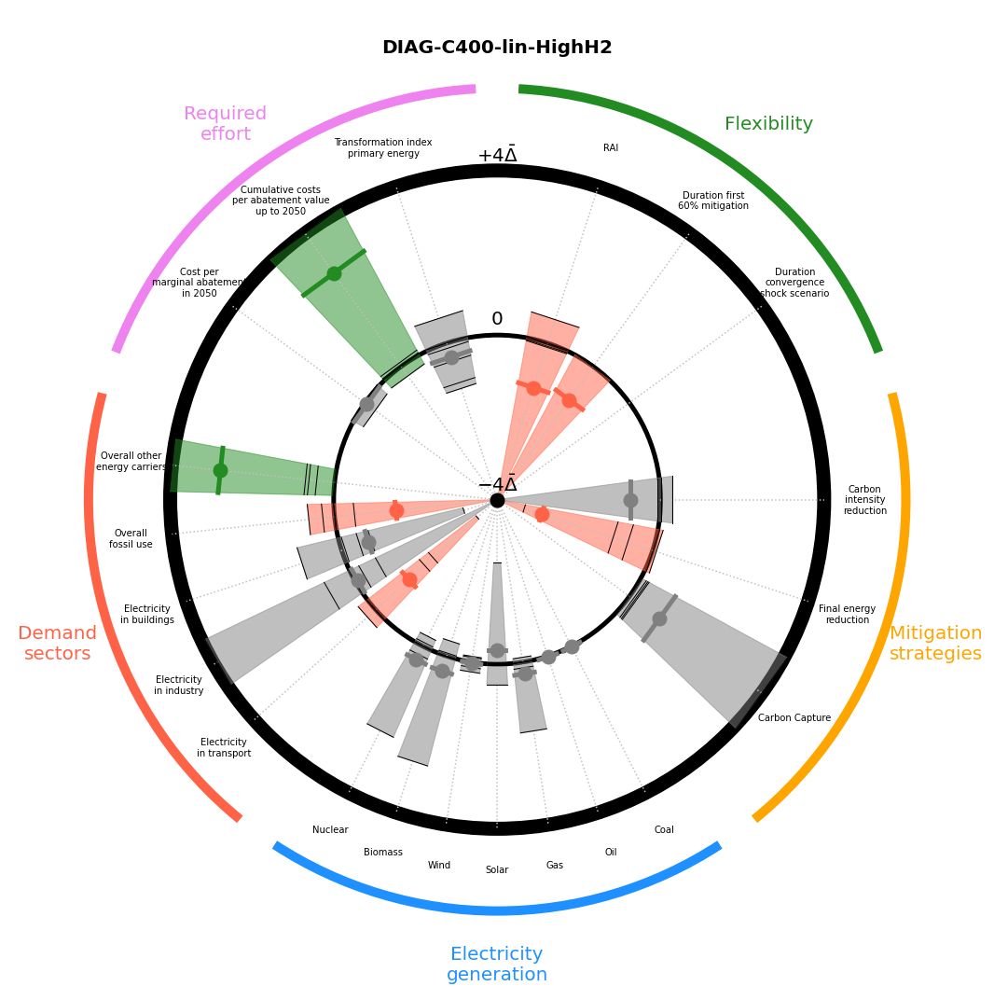

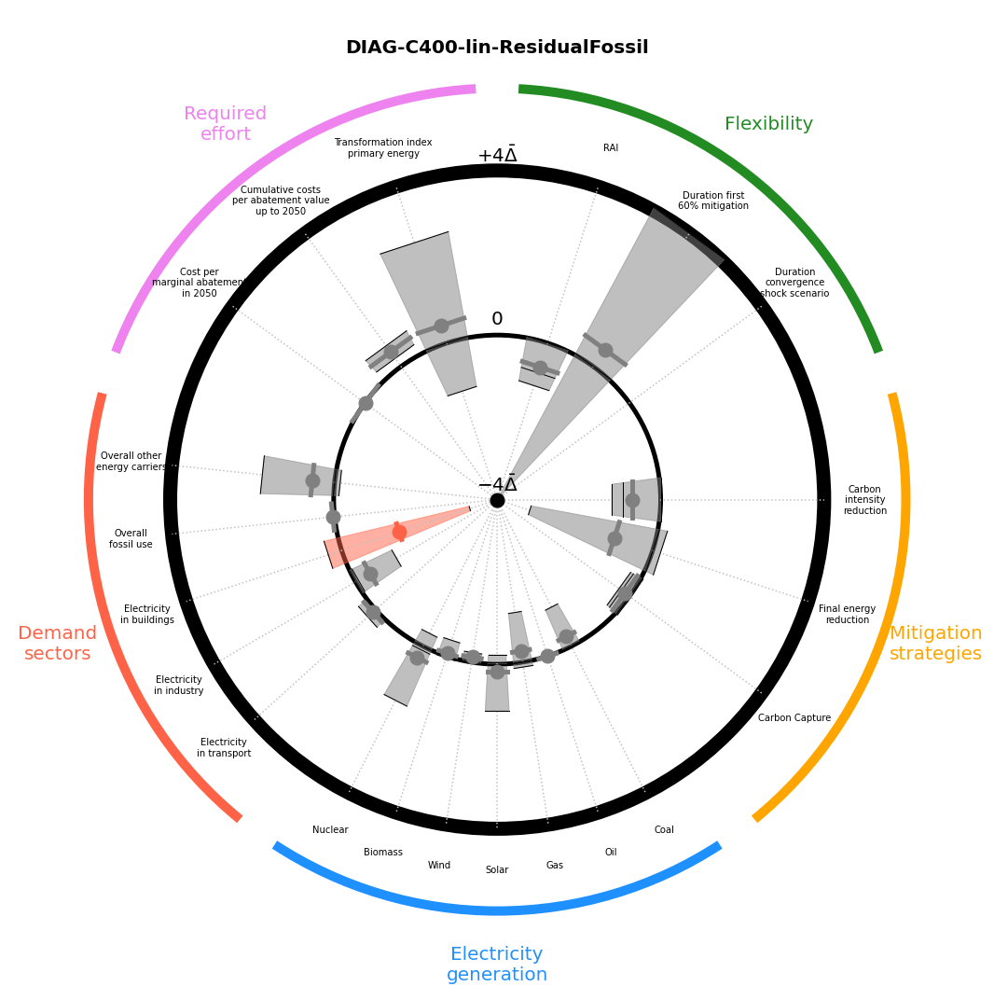

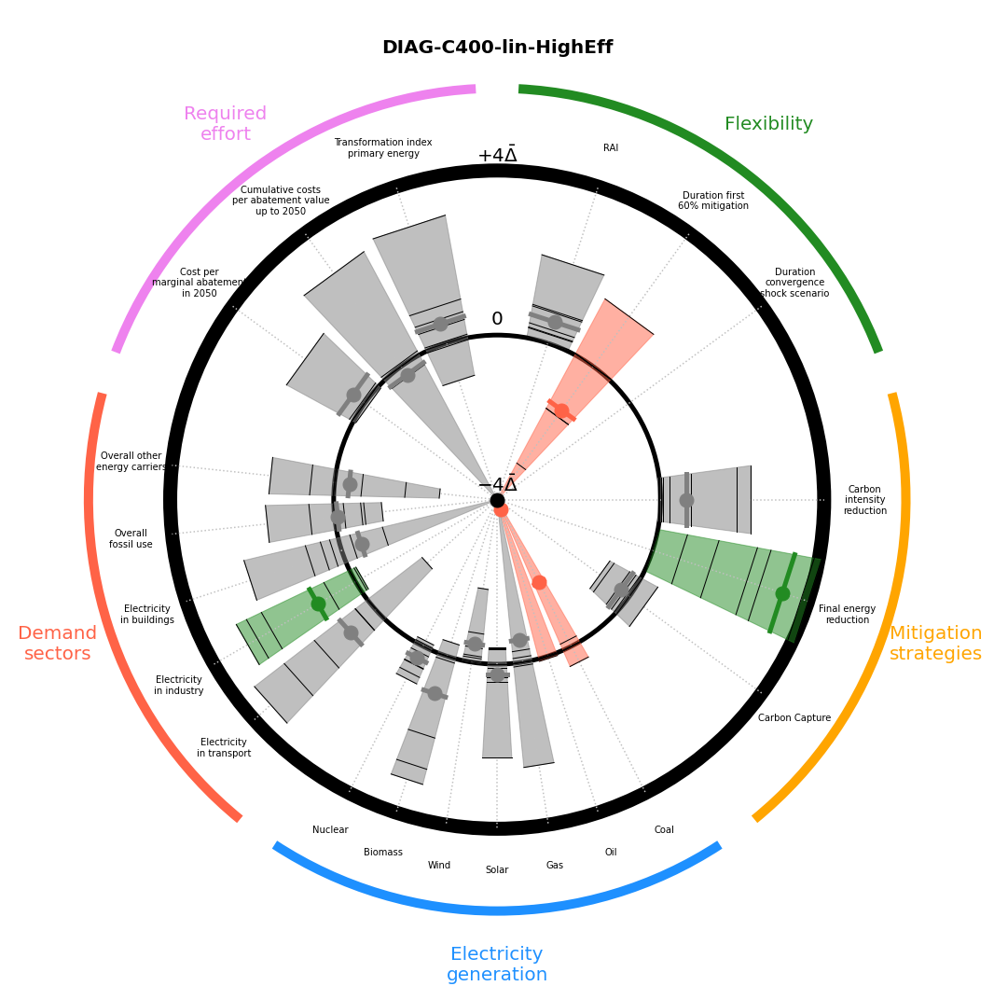

In [146]:
for scen in c400lins:
        if scen != "DIAG-C400-lin":
                circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
                circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
                dr = 3
                vars = [["RAI", "ReactionTime", "Convergence"],
                        ["CIred", "FEred", "CC"], # neg emis
                        ["E_coal", "E_oil", "E_gas", "E_solar", "E_wind", "E_biomass2", "E_nuclear"],
                        ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
                        ["CAV", "CAVcum", "TI"]
                        ]
                names = [["RAI", "Duration first\n60% mitigation", "Duration\nconvergence\nshock scenario"],
                        ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon Capture"],
                        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
                        ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Overall\nfossil use", "Overall other\nenergy carriers"],
                        ["Cost per\nmarginal abatement\nin 2050", "Cumulative costs\nper abatement value\nup to 2050", "Transformation index\nprimary energy"]]
                cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
                incr = 360/len(vars)
                da = (90 - 360/len(vars))
                arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
                arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
                arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
                arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
                arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)


                fig, ax = plt.subplots(1, 1, figsize=(15, 15))
                ax.add_patch(circle_border)
                ax.add_patch(circle_average)
                ax.add_patch(arc_outer_1)
                ax.add_patch(arc_outer_2)
                ax.add_patch(arc_outer_3)
                ax.add_patch(arc_outer_4)
                ax.add_patch(arc_outer_5)
                ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)

                # Actual data
                time = 2050
                for vl_i, vl in enumerate(vars):
                        for var_i, var in enumerate(vl):
                                pas = []
                                pbs = []
                                vals = []
                                valraws = []
                                for model in Models_touse:
                                        if var == "E_biomass" and model == "IMAGE 3.2":
                                                var = "E_biomass2"
                                        angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                        zero = 0
                                        meandev = float(np.abs(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var] - XRe.sel(Time=time, Model=Models_touse, Scenario="DIAG-C400-lin")[var]).mean())
                                        min = zero - 4*meandev
                                        max = zero + 4*meandev
                                        valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var]) - float(XRe.sel(Time=time, Scenario="DIAG-C400-lin", Model=model)[var])
                                        if max != min:
                                                val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                        else:
                                                val = np.nan
                                        valraws.append(val)
                                        val = np.max([0, val])
                                        val = np.min([0.8, val])
                                        p = point(angle, val)
                                        #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                        _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                        pas.append(pa)
                                        pbs.append(pb)
                                        vals.append(val)
                                        ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c='k', lw=1, zorder=1e9)

                                        if model == "IMAGE 3.2":
                                                p0 = point(angle, 0.4*2)
                                                ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                                p0 = point(angle, 0.4*2+0.1)
                                                ax.text(p0[0], p0[1], names[vl_i][var_i], ha='center', va='center')
                                                #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                                #ax.add_patch(t1)
                                pas = np.array(pas)
                                pbs = np.array(pbs)
                                vals = np.array(vals)
                                if np.nansum(vals) != 0:
                                        w_min = np.where(vals == np.nanmin(vals))[0][0]
                                        w_max = np.where(vals == np.nanmax(vals))[0][0]
                                        
                                        mn = np.nanmean(valraws)
                                        col = 'grey'
                                        if mn >= 0.5:
                                                col = "forestgreen"
                                        if mn <= 0.3:
                                                col = "tomato"

                                        pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=col, alpha=0.5)
                                        ax.add_patch(pol)
                                        if mn >=0 and mn <=0.8:
                                                p, pa, pb = point_ex(angle, mn, 0.4*mn/len(vl))
                                                ax.plot([p[0]], [p[1]], 'o', c=col, ms=15, zorder=1e9)
                                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=col, lw=5, zorder=1e9)

                ax.text(0.5, 0.52, r'$-4\bar{\Delta}$', fontsize=20, ha='center', va='center', zorder=1e999)
                ax.text(0.5, 0.72, r'$0$', fontsize=20, ha='center', va='center', zorder=1e999)
                ax.text(0.5, 0.92, r'$+4\bar{\Delta}$', fontsize=20, ha='center', va='center', zorder=1e999)

                Cats = ["Flexibility", "Mitigation strategies", "Electricity generation", "Demand sectors", "Required effort"]
                for c_i, c in enumerate(Cats):
                        p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
                        cl = c.split(' ')
                        if len(cl)>1:
                                c = cl[0]+'\n'+cl[1]
                                ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
                        else:
                                ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

                # Other
                ax.text(0.5, 1.05, scen, fontsize=20, ha='center', va='center', weight='bold')
                ax.set_xlim([-0.1, 1.1])
                ax.set_ylim([-0.1, 1.1])
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(False)
                ax.spines['left'].set_visible(False)
                ax.get_xaxis().set_ticks([])
                ax.get_yaxis().set_ticks([])

                plt.tight_layout()
                plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/Scenarios/WindRose_"+scen[14:14+7]+".png", dpi = 200, bbox_inches = "tight")

Scenario version with PE

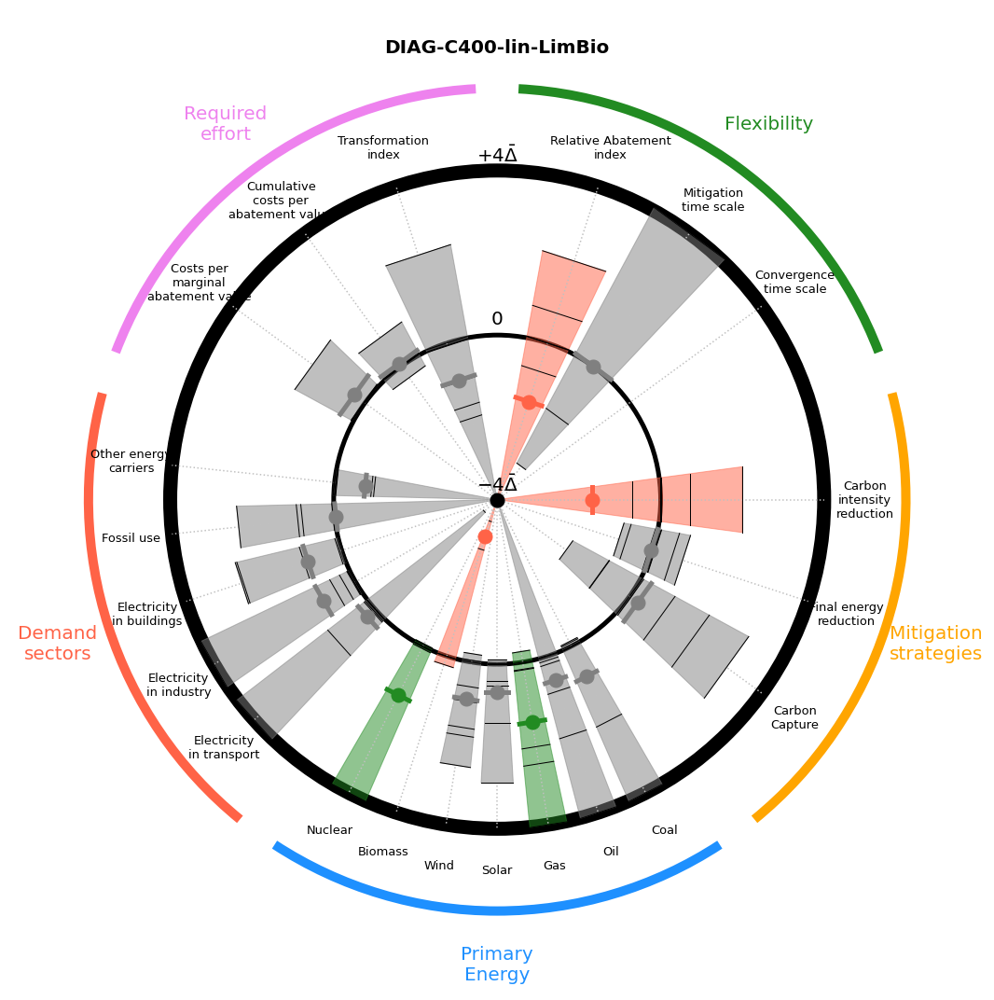

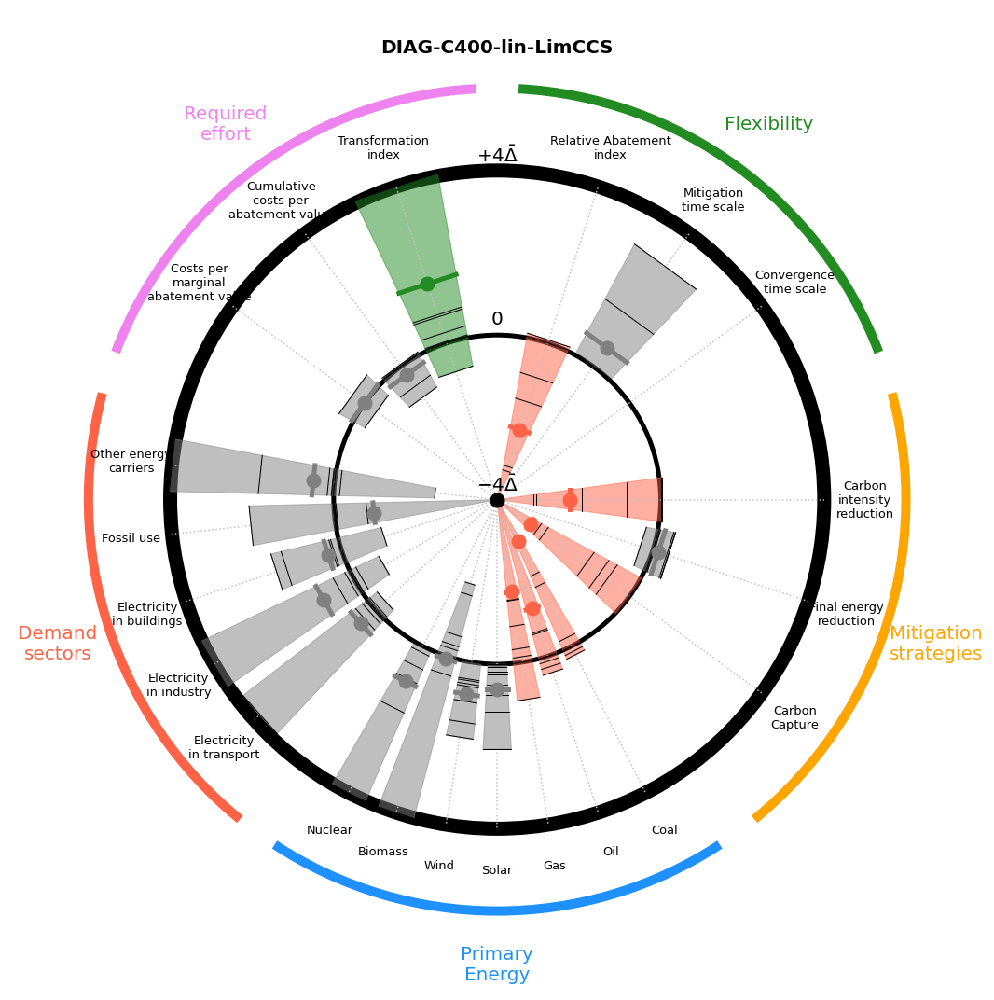

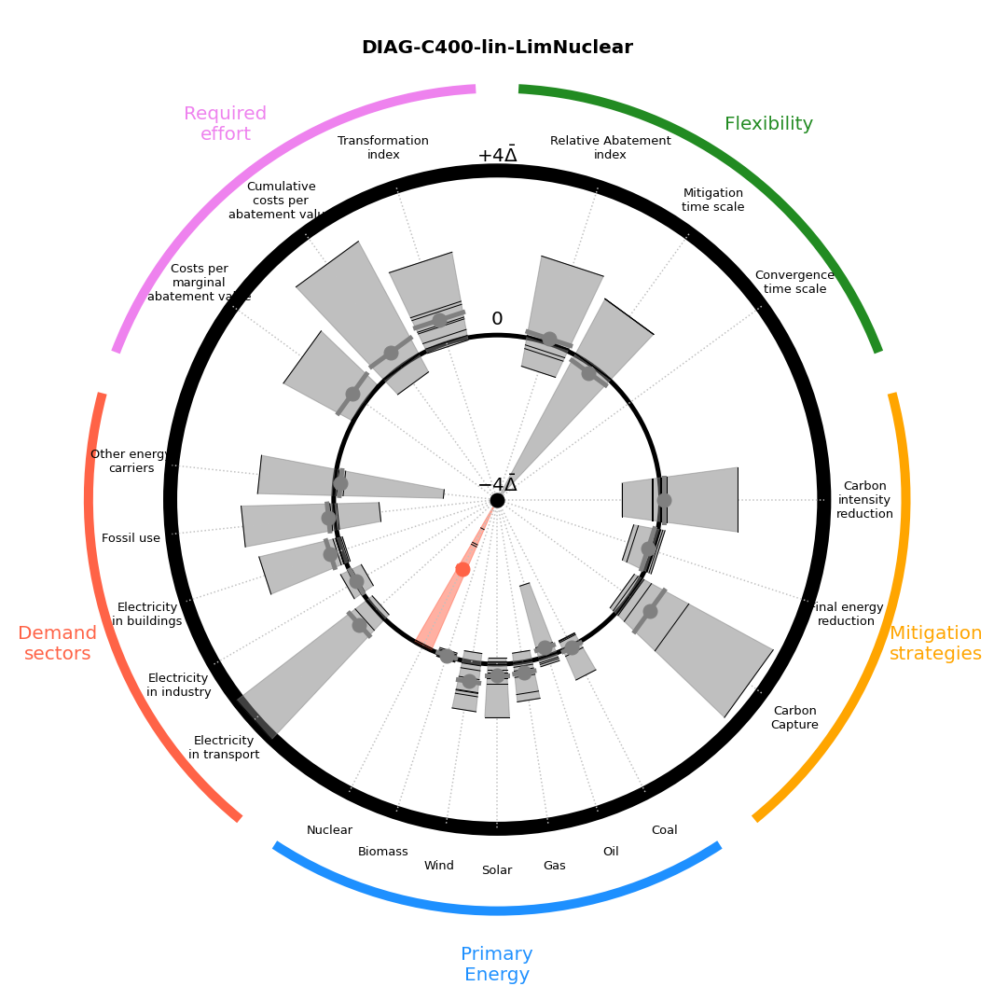

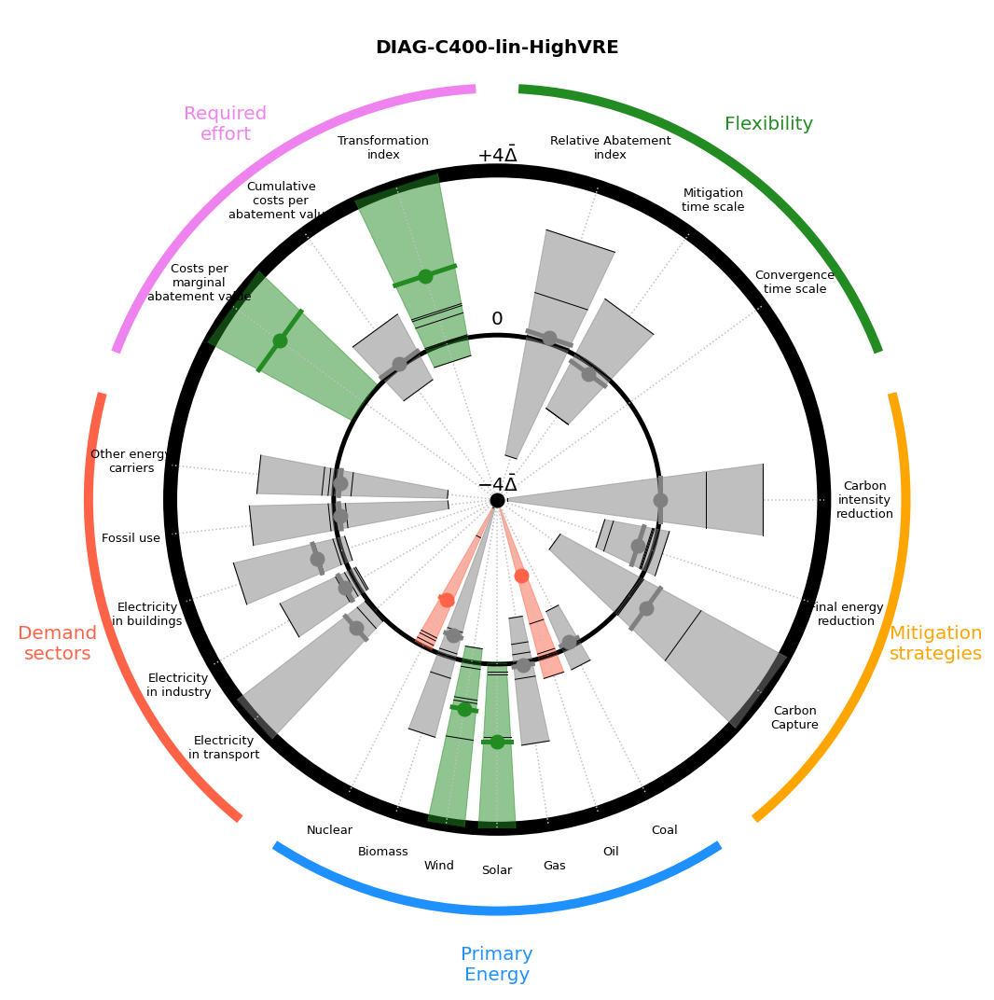

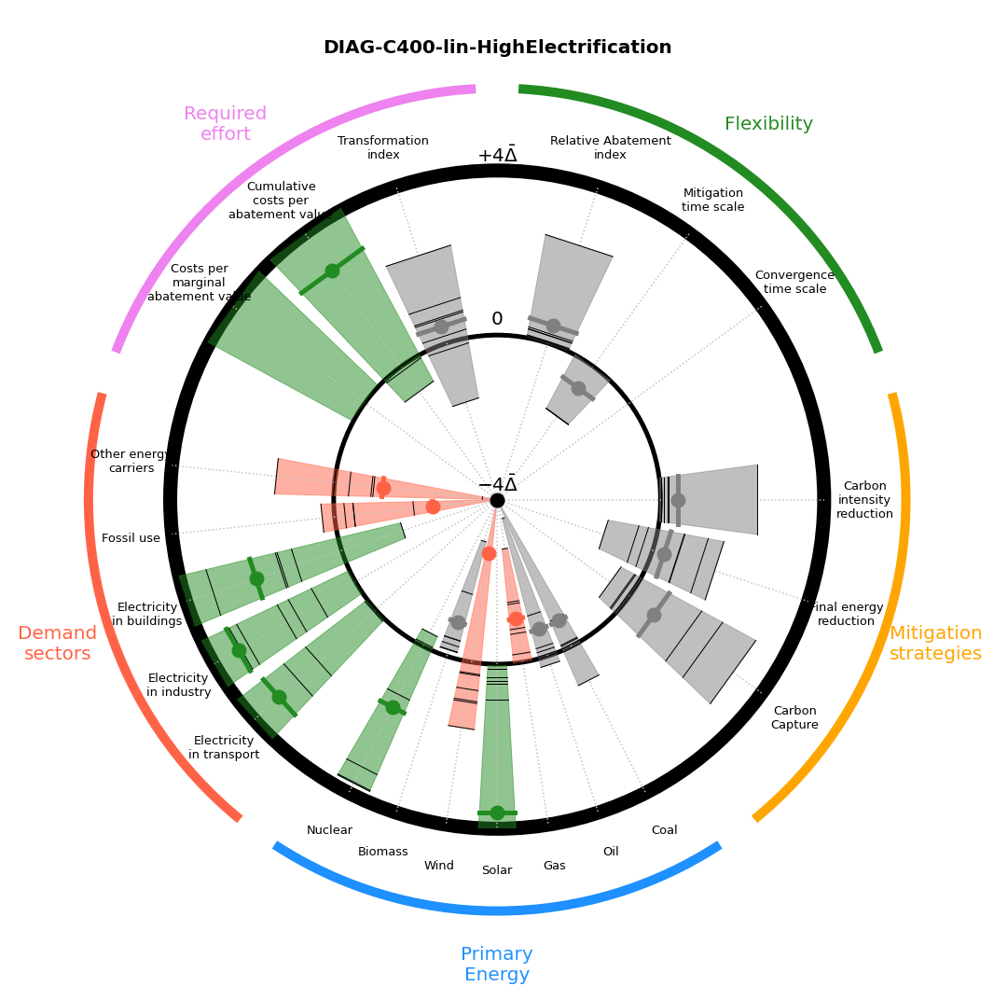

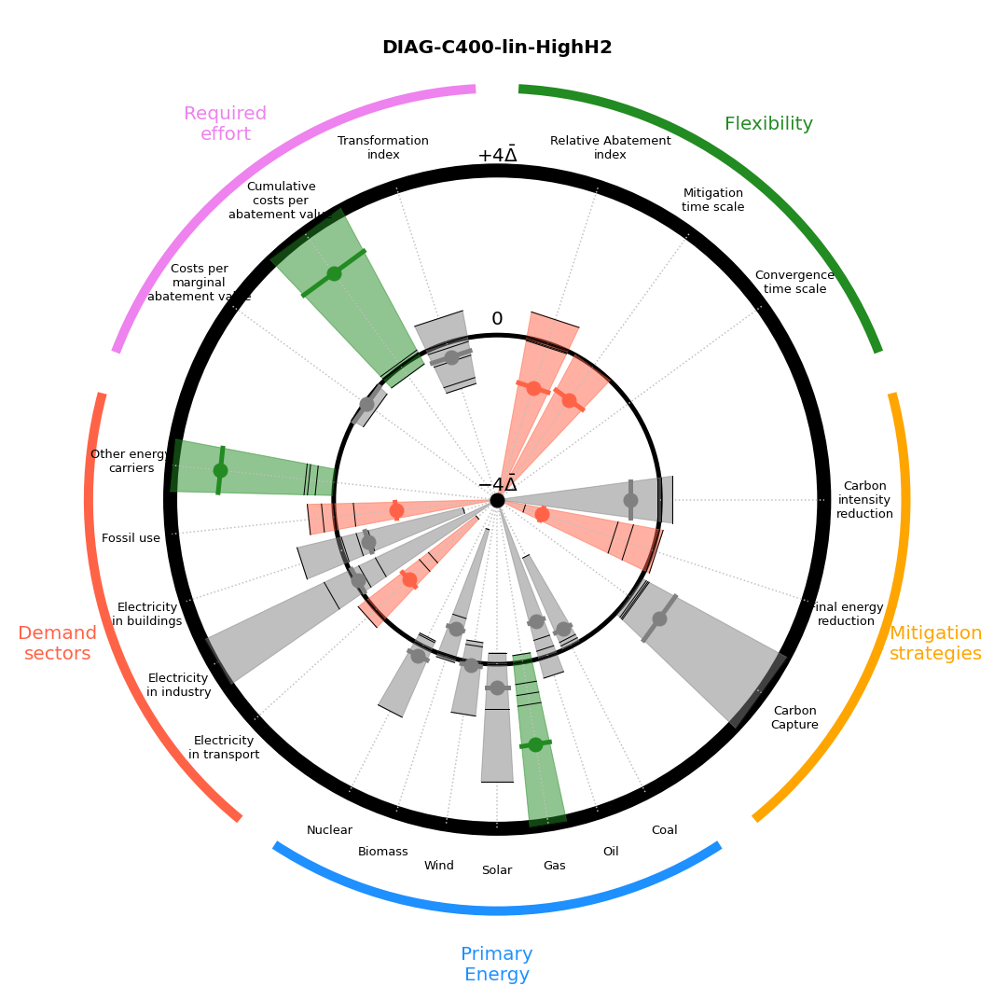

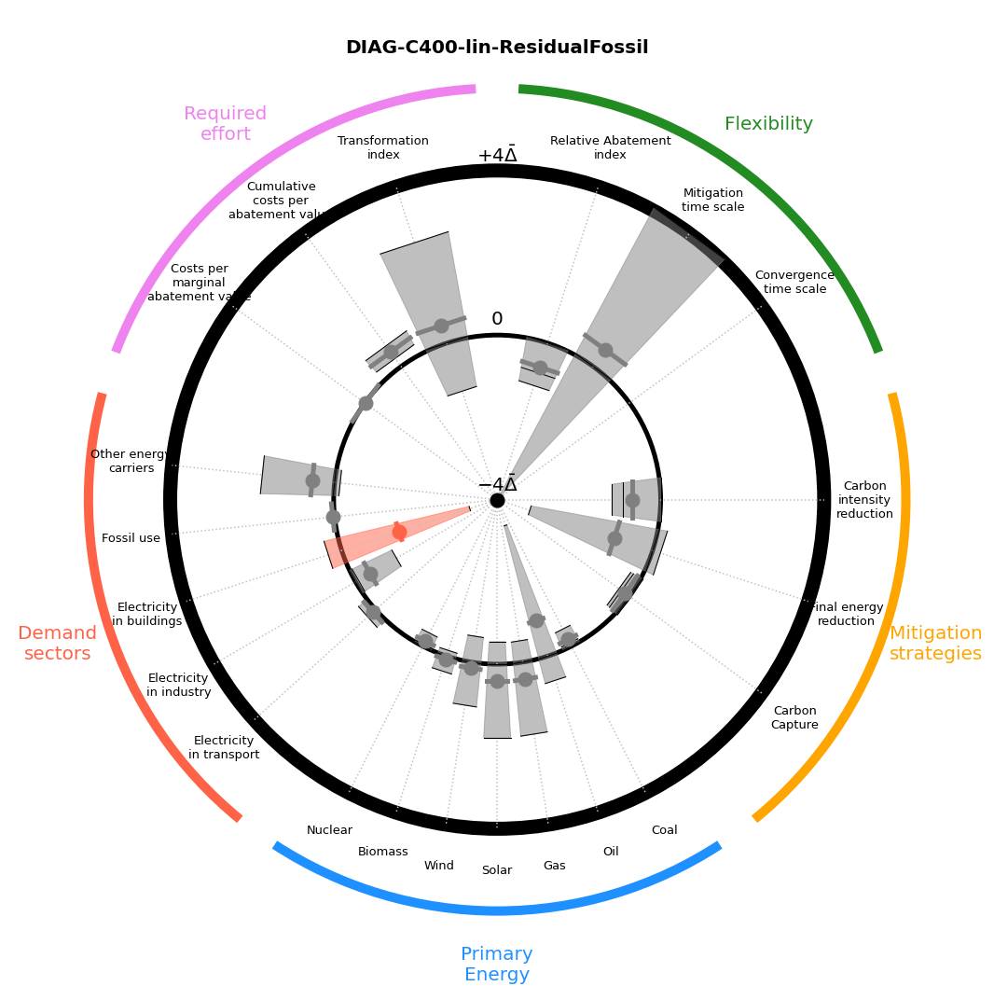

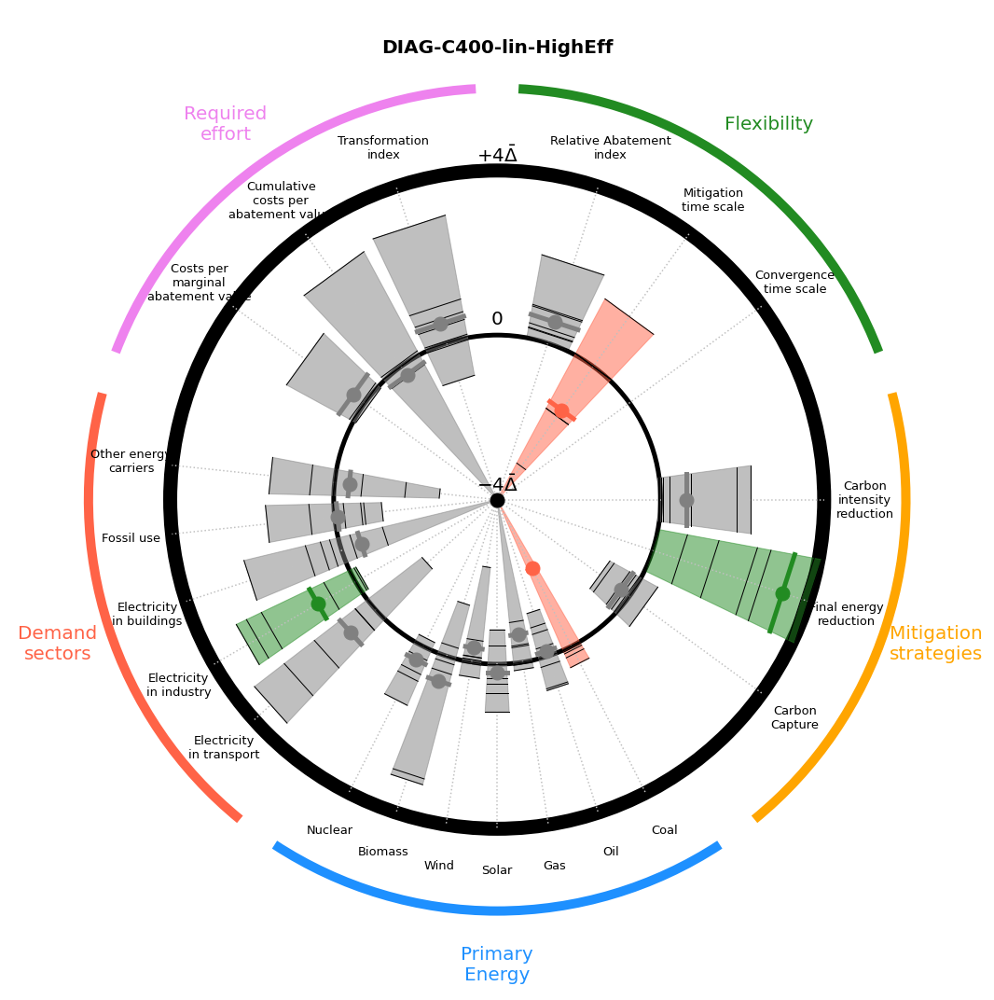

In [147]:
for scen in c400lins:
        if scen != "DIAG-C400-lin":
                circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
                circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
                dr = 3
                vars = [["RAI", "ReactionTime", "Convergence"],
                        ["CIred", "FEred", "CC"], # neg emis
                        ["P_coal", "P_oil", "P_gas", "P_solar", "P_wind", "P_biomass", "P_nuclear"],
                        ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
                        ["CAV", "CAVcum", "TI"]
                        ]
                names = [["Relative Abatement\nindex", "Mitigation\ntime scale", "Convergence\ntime scale"],
                        ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon\nCapture"],
                        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
                        ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Fossil use", "Other energy\ncarriers"],
                        ["Costs per\nmarginal\nabatement value", "Cumulative\ncosts per\nabatement value", "Transformation\nindex"]]
                cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
                incr = 360/len(vars)
                da = (90 - 360/len(vars))
                arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
                arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
                arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
                arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
                arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)


                fig, ax = plt.subplots(1, 1, figsize=(15, 15))
                ax.add_patch(circle_border)
                ax.add_patch(circle_average)
                ax.add_patch(arc_outer_1)
                ax.add_patch(arc_outer_2)
                ax.add_patch(arc_outer_3)
                ax.add_patch(arc_outer_4)
                ax.add_patch(arc_outer_5)
                ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)

                # Actual data
                time = 2050
                for vl_i, vl in enumerate(vars):
                        for var_i, var in enumerate(vl):
                                pas = []
                                pbs = []
                                vals = []
                                valraws = []
                                for model in Models_touse:
                                        angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                        zero = 0
                                        meandev = float(np.abs(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var] - XRe.sel(Time=time, Model=Models_touse, Scenario="DIAG-C400-lin")[var]).mean())
                                        min = zero - 4*meandev
                                        max = zero + 4*meandev
                                        valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var]) - float(XRe.sel(Time=time, Scenario="DIAG-C400-lin", Model=model)[var])
                                        if max != min:
                                                val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                        else:
                                                val = np.nan
                                        valraws.append(val)
                                        val = np.max([0, val])
                                        val = np.min([0.8, val])
                                        p = point(angle, val)
                                        #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                        _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                        pas.append(pa)
                                        pbs.append(pb)
                                        vals.append(val)
                                        ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c='k', lw=1, zorder=1e9)

                                        if model == "IMAGE 3.2":
                                                p0 = point(angle, 0.4*2)
                                                ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                                p0 = point(angle, 0.4*2+0.1)
                                                ax.text(p0[0], p0[1], names[vl_i][var_i], fontsize=13, ha='center', va='center')
                                                #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                                #ax.add_patch(t1)
                                pas = np.array(pas)
                                pbs = np.array(pbs)
                                vals = np.array(vals)
                                if np.nansum(vals) != 0:
                                        w_min = np.where(vals == np.nanmin(vals))[0][0]
                                        w_max = np.where(vals == np.nanmax(vals))[0][0]
                                        
                                        mn = np.nanmean(valraws)
                                        col = 'grey'
                                        if mn >= 0.5:
                                                col = "forestgreen"
                                        if mn <= 0.3:
                                                col = "tomato"

                                        pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=col, alpha=0.5)
                                        ax.add_patch(pol)
                                        if mn >=0 and mn <=0.8:
                                                p, pa, pb = point_ex(angle, mn, 0.4*mn/len(vl))
                                                ax.plot([p[0]], [p[1]], 'o', c=col, ms=15, zorder=1e9)
                                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=col, lw=5, zorder=1e9)

                ax.text(0.5, 0.52, r'$-4\bar{\Delta}$', fontsize=20, ha='center', va='center', zorder=1e999)
                ax.text(0.5, 0.72, r'$0$', fontsize=20, ha='center', va='center', zorder=1e999)
                ax.text(0.5, 0.92, r'$+4\bar{\Delta}$', fontsize=20, ha='center', va='center', zorder=1e999)

                Cats = ["Flexibility", "Mitigation strategies", "Primary Energy", "Demand sectors", "Required effort"]
                for c_i, c in enumerate(Cats):
                        p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
                        cl = c.split(' ')
                        if len(cl)>1:
                                c = cl[0]+'\n'+cl[1]
                                ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
                        else:
                                ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

                # Other
                ax.text(0.5, 1.05, scen, fontsize=20, ha='center', va='center', weight='bold')
                ax.set_xlim([-0.1, 1.1])
                ax.set_ylim([-0.1, 1.1])
                ax.spines['top'].set_visible(False)
                ax.spines['right'].set_visible(False)
                ax.spines['bottom'].set_visible(False)
                ax.spines['left'].set_visible(False)
                ax.get_xaxis().set_ticks([])
                ax.get_yaxis().set_ticks([])

                plt.tight_layout()
                plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/ScenariosPE/WindRose_"+scen[14:14+7]+".png", dpi = 200, bbox_inches = "tight")

All eight

In [148]:
dr = 3
vars = [["RAI", "ReactionTime", "Convergence"],
        ["CIred", "FEred", "CC"], # neg emis
        ["E_coal", "E_oil", "E_gas", "E_solar", "E_wind", "E_biomass2", "E_nuclear"],
        ["D_Etrans", "D_Eindus", "D_Ebuild", "Fossil_total", "Other_total"],
        ["CAV", "CAVcum", "TI"]
        ]
names = [["RAI", "Duration first\n60% mitigation", "Duration\nconvergence\nshock scenario"],
        ["Carbon\nintensity\nreduction", "Final energy\nreduction", "Carbon Capture"],
        ["Coal", "Oil", "Gas", "Solar", "Wind", "Biomass", "Nuclear"],
        ["Electricity\nin transport", "Electricity\nin industry", "Electricity\nin buildings", "Overall\nfossil use", "Overall other\nenergy carriers"],
        ["Cost per\nmarginal abatement\nin 2050", "Cumulative costs\nper abatement value\nup to 2050", "Transformation index\nprimary energy"]]
cols = ['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet']
incr = 360/len(vars)
da = (90 - 360/len(vars))

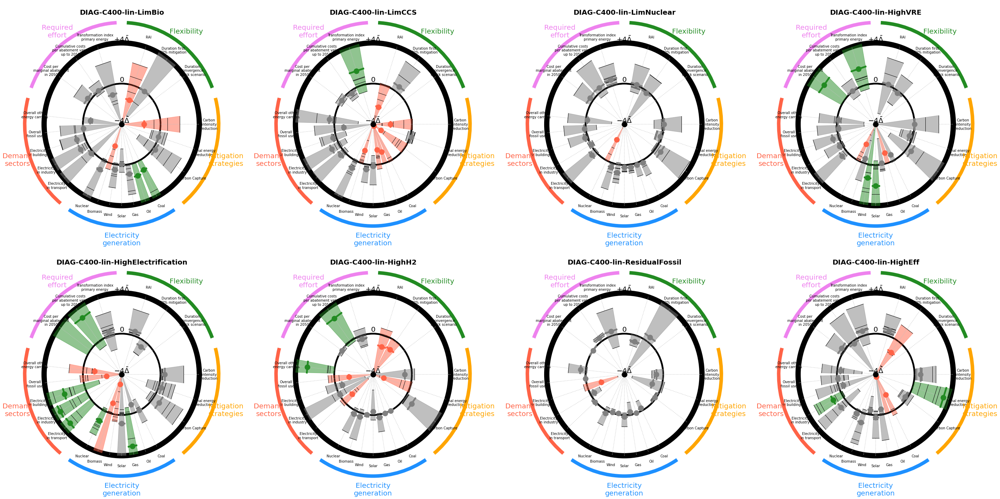

In [149]:
#fig, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9)) = plt.subplots(3, 3, figsize=(30, 30))
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(40, 20))

for ax_i, ax in enumerate([ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]):
        model = Models_touse[ax_i]
        scen = scen_noc400[ax_i]

        circle_border = plt.Circle((0.5, 0.5), 0.4, facecolor='white', edgecolor='k', lw=15)
        circle_average = plt.Circle((0.5, 0.5), 0.2, facecolor='white', edgecolor='k', lw=5)
        arc_outer_1 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+0+dr, theta2=da+incr-dr, color=cols[0], lw=10)
        arc_outer_5 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*4+dr, theta2=da+incr*5-dr, color=cols[1], lw=10)
        arc_outer_4 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*3+dr, theta2=da+incr*4-dr, color=cols[2], lw=10)
        arc_outer_3 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr*2+dr, theta2=da+incr*3-dr, color=cols[3], lw=10)
        arc_outer_2 = pth.Arc((0.5, 0.5), 1, 1, theta1=da+incr+dr, theta2=da+incr*2-dr, color=cols[4], lw=10)

        ax.add_patch(circle_border)
        ax.add_patch(circle_average)
        ax.add_patch(arc_outer_1)
        ax.add_patch(arc_outer_2)
        ax.add_patch(arc_outer_3)
        ax.add_patch(arc_outer_4)
        ax.add_patch(arc_outer_5)
        ax.plot([0.5], [0.5], 'ko', ms=15, zorder=1e99)

        # Actual data
        time = 2050
        for vl_i, vl in enumerate(vars):
                for var_i, var in enumerate(vl):
                        pas = []
                        pbs = []
                        vals = []
                        valraws = []
                        for model in Models_touse:
                                if var == "E_biomass" and model == "IMAGE 3.2":
                                        var = "E_biomass2"
                                angle = (360/len(vars))*vl_i+((360/len(vars))/(len(vl)+1))*(var_i+1)
                                zero = 0
                                meandev = float(np.abs(XRe.sel(Time=time, Model=Models_touse, Scenario=c400lins)[var] - XRe.sel(Time=time, Model=Models_touse, Scenario="DIAG-C400-lin")[var]).mean())
                                min = zero - 4*meandev
                                max = zero + 4*meandev
                                valraw = float(XRe.sel(Time=time, Scenario=scen, Model=model)[var]) - float(XRe.sel(Time=time, Scenario="DIAG-C400-lin", Model=model)[var])
                                if max != min:
                                        val = (((valraw - min) / (max - min) - 0.5)*0.8 + 0.4)
                                else:
                                        val = np.nan
                                valraws.append(val)
                                val = np.max([0, val])
                                val = np.min([0.8, val])
                                p = point(angle, val)
                                #ax.plot([p[0]], [p[1]], 'o', c=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][vl_i], ms=5, zorder=1e9)

                                _, pa, pb = point_ex(angle, val, 0.4*val/len(vl))
                                pas.append(pa)
                                pbs.append(pb)
                                vals.append(val)
                                ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c='k', lw=1, zorder=1e9)

                                if model == "IMAGE 3.2":
                                        p0 = point(angle, 0.4*2)
                                        ax.plot([0.5, p0[0]], [0.5, p0[1]], ':', c='silver', zorder=1e9-1)
                                        p0 = point(angle, 0.4*2+0.1)
                                        ax.text(p0[0], p0[1], names[vl_i][var_i], ha='center', va='center')
                                        #t1 = plt.Polygon([[0.5, 0.5], pa, pb], color=['forestgreen', 'orange', 'dodgerblue', 'tomato'][vl_i], alpha=0.5)
                                        #ax.add_patch(t1)
                        pas = np.array(pas)
                        pbs = np.array(pbs)
                        vals = np.array(vals)
                        if np.nansum(vals) != 0:
                                w_min = np.where(vals == np.nanmin(vals))[0][0]
                                w_max = np.where(vals == np.nanmax(vals))[0][0]
                                
                                mn = np.nanmean(valraws)
                                col = 'grey'
                                if mn >= 0.5:
                                        col = "forestgreen"
                                if mn <= 0.3:
                                        col = "tomato"

                                pol = plt.Polygon([pas[w_min], pas[w_max], pbs[w_max], pbs[w_min]], color=col, alpha=0.5)
                                ax.add_patch(pol)
                                p, pa, pb = point_ex(angle, mn, 0.4*mn/len(vl))
                                if mn >=0 and mn <= 0.8:
                                        ax.plot([p[0]], [p[1]], 'o', c=col, ms=15, zorder=1e9)
                                        ax.plot([pa[0], pb[0]], [pa[1], pb[1]], c=col, lw=5, zorder=1e9)

        ax.text(0.5, 0.52, r'$-4\bar{\Delta}$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.72, r'$0$', fontsize=20, ha='center', va='center', zorder=1e999)
        ax.text(0.5, 0.92, r'$+4\bar{\Delta}$', fontsize=20, ha='center', va='center', zorder=1e999)

        Cats = ["Flexibility", "Mitigation strategies", "Electricity generation", "Demand sectors", "Required effort"]
        for c_i, c in enumerate(Cats):
                p0 = point((360/len(Cats))/2+c_i*(360/len(Cats)), 1.13)
                cl = c.split(' ')
                if len(cl)>1:
                        c = cl[0]+'\n'+cl[1]
                        ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')
                else:
                        ax.text(p0[0], p0[1], c, color=['forestgreen', 'orange', 'dodgerblue', 'tomato', 'violet'][c_i], fontsize=20, va='center', ha='center')

        # Other
        ax.text(0.5, 1.05, scen, fontsize=20, ha='center', va='center', weight='bold')
        ax.set_xlim([-0.1, 1.1])
        ax.set_ylim([-0.1, 1.1])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])

plt.tight_layout()
plt.savefig("X:/user/dekkerm/Projects/ECEMF/WP1/Figures/LandscapeFigures/Scenarios/WindRose_allscens.png", dpi = 200, bbox_inches = "tight")